# Packages

In [1]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import contextily as cx
import xarray as xr
from datetime import datetime, timedelta

import matplotlib.pyplot as plt
from matplotlib import cm

from sklearn.metrics import (mean_squared_error, 
                             mean_absolute_error, 
                             mean_absolute_percentage_error)
from scipy.stats import pearsonr

from cmaqpy.runcmaq import CMAQModel
from cmaqpy import plots
from cmaqpy import utils
import monetio as mio

# Read CMAQ outputs

In [2]:
winter_sim = {
    'start_date': utils.format_date('2018-01-01'),
    'end_date': utils.format_date('2018-01-08'),
    'base_case_dir': '/mnt/Bo_HDD2/cmaq_data/CMAQ_v5.4/data/2018-01-01_2018-01-08_2018_12US1/post',
    'nygrid_case_dir': '/mnt/Bo_HDD2/cmaq_data/CMAQ_v5.4/data/2018-01-01_2018-01-08_2018_12US1_nygrid/post',
}

summer_sim = {
    'start_date': utils.format_date('2018-07-02'),
    'end_date': utils.format_date('2018-07-09'),
    'base_case_dir': '/mnt/Bo_HDD2/cmaq_data/CMAQ_v5.4/data/2018-07-02_2018-07-09_2018_12US1/post',
    'nygrid_case_dir': '/mnt/Bo_HDD2/cmaq_data/CMAQ_v5.4/data/2018-07-02_2018-07-09_2018_12US1_nygrid/post',
}

In [60]:
conc_pfx = "COMBINE_ACONC_v54_gcc11.3.0"
dep_pfx = "COMBINE_DEP_v54_gcc11.3.0"

# Base case winter
app = "2018_12US1"
conc_winter_base = mio.cmaq.open_mfdataset(
    os.path.join(winter_sim['base_case_dir'], 
                 f"{conc_pfx}_{app}_{winter_sim['start_date'].strftime('%Y%m')}.nc"))
dep_winter_base = mio.cmaq.open_mfdataset(
    os.path.join(winter_sim['base_case_dir'], 
                 f"{dep_pfx}_{app}_{winter_sim['start_date'].strftime('%Y%m')}"))

# Base case summer
conc_summer_base = mio.cmaq.open_mfdataset(
    os.path.join(summer_sim['base_case_dir'], 
                 f"{conc_pfx}_{app}_{summer_sim['start_date'].strftime('%Y%m')}.nc"))
dep_summer_base = mio.cmaq.open_mfdataset(
    os.path.join(summer_sim['base_case_dir'], 
                 f"{dep_pfx}_{app}_{summer_sim['start_date'].strftime('%Y%m')}"))

# NYGrid case winter
app = "2018_12US1_nygrid"
conc_winter_nygrid = mio.cmaq.open_mfdataset(
    os.path.join(winter_sim['nygrid_case_dir'], 
                 f"{conc_pfx}_{app}_{winter_sim['start_date'].strftime('%Y%m')}.nc"))
dep_winter_nygrid = mio.cmaq.open_mfdataset(
    os.path.join(winter_sim['nygrid_case_dir'], 
                 f"{dep_pfx}_{app}_{winter_sim['start_date'].strftime('%Y%m')}"))

# NYGrid case summer
conc_summer_nygrid = mio.cmaq.open_mfdataset(
    os.path.join(summer_sim['nygrid_case_dir'], 
                 f"{conc_pfx}_{app}_{summer_sim['start_date'].strftime('%Y%m')}.nc"))
dep_summer_nygrid = mio.cmaq.open_mfdataset(
    os.path.join(summer_sim['nygrid_case_dir'], 
                 f"{dep_pfx}_{app}_{summer_sim['start_date'].strftime('%Y%m')}"))

/home/by276/anaconda3/envs/optwrf_new/lib/python3.7/site-packages/pyproj/crs/crs.py:1256: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  return self._crs.to_proj4(version=version)
/home/by276/anaconda3/envs/optwrf_new/lib/python3.7/site-packages/pyproj/crs/crs.py:1256: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  return self._crs.to_proj4(version=version)
/home/by276/anaconda3/envs/optwrf_new/lib/python3.7/site-packages/pyproj/crs/crs.py:1256: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

In [4]:
# Convert all to Eastern Time
conc_winter_base = utils.convert_tz_xr(conc_winter_base)
conc_winter_nygrid = utils.convert_tz_xr(conc_winter_nygrid)
conc_summer_base = utils.convert_tz_xr(conc_summer_base)
conc_summer_nygrid = utils.convert_tz_xr(conc_summer_nygrid)

# Get map projections and boundaries
ccrs = plots.get_proj(conc_winter_base)
proj_bounds = plots.get_domain_boundary(conc_winter_base, ccrs)


## 1. Read AirNOW data

In [5]:
def airnow_data_format(data: pd.DataFrame,
                       start_date: datetime,
                       end_date: datetime) -> pd.DataFrame:

    sites = data['Site/Site AQS/Param/POC'].unique()

    site_data_list = list()
    for site in sites:
        site_name = site.split('/')[0]
        site_data = data[data['Site/Site AQS/Param/POC'] == site]
        site_data = site_data.drop(columns=['Site/Site AQS/Param/POC'])
        site_data = site_data.set_index('Date (LST)')
        site_data.index = pd.to_datetime(site_data.index)

        # site_daily_avg = site_data['Average']
        # site_daily_max = site_data['Max']
        site_data = site_data.drop(columns=['Average', 'Max'])

        # Unstack the dataframe
        site_data_combined = list()
        for idx, row in site_data.iterrows():
            time_index = pd.date_range(idx, idx+timedelta(hours=23), freq='H')
            daily_data = pd.DataFrame({site_name: row.values}, index=time_index)
            site_data_combined.append(daily_data)
        site_data_combined = pd.concat(site_data_combined)
        site_data_combined.name = site_name
        site_data_list.append(site_data_combined)

    time_index = pd.date_range(start_date, end_date+timedelta(hours=23), freq='H')
    site_data_df = pd.concat(site_data_list, axis=1)

    return site_data_df


In [6]:
airnow_dir = '/mnt/Bo_HDD2/cmaq_data/CMAQ_v5.4/cmaqpy/data/airnow'
assert os.path.exists(airnow_dir), f"Path {airnow_dir} does not exist"

airnow_winter_site_data = dict()
winter_dates_pfx = f"{winter_sim['start_date'].strftime('%Y-%m-%d')}_{winter_sim['end_date'].strftime('%Y-%m-%d')}"
airnow_winter_site_data['O3'] = pd.read_csv(os.path.join(airnow_dir, f'{winter_dates_pfx}_hourly_ozone_ppb.csv'))
airnow_winter_site_data['O3'] = airnow_data_format(airnow_winter_site_data['O3'], winter_sim['start_date'], winter_sim['end_date'])
airnow_winter_site_data['PM25'] = pd.read_csv(os.path.join(airnow_dir, f'{winter_dates_pfx}_hourly_pm25_ugm3.csv'))
airnow_winter_site_data['PM25'] = airnow_data_format(airnow_winter_site_data['PM25'], winter_sim['start_date'], winter_sim['end_date'])

airnow_summer_site_data = dict()
summer_dates_pfx = f"{summer_sim['start_date'].strftime('%Y-%m-%d')}_{summer_sim['end_date'].strftime('%Y-%m-%d')}"
airnow_summer_site_data['O3'] = pd.read_csv(os.path.join(airnow_dir, f'{summer_dates_pfx}_hourly_ozone_ppb.csv'))
airnow_summer_site_data['O3'] = airnow_data_format(airnow_summer_site_data['O3'], summer_sim['start_date'], summer_sim['end_date'])
airnow_summer_site_data['PM25'] = pd.read_csv(os.path.join(airnow_dir, f'{summer_dates_pfx}_hourly_pm25_ugm3.csv'))
airnow_summer_site_data['PM25'] = airnow_data_format(airnow_summer_site_data['PM25'], summer_sim['start_date'], summer_sim['end_date'])

In [7]:
# Read AirNow site locations
airnow_sites = pd.read_csv(os.path.join(airnow_dir, 'NYS_airnow_site_location.csv'))
airnow_sites.head()

,Name,Lat,Lon
0,Albany,42.64225,-73.75457
1,Bklyn - PS 314,40.64182,-74.01865
2,Bklyn - PS274,40.69454,-73.92769
3,Bronx - IS52,40.81617,-73.90200
4,Bronx - IS74,40.81551,-73.88555


In [8]:
site_names = set(airnow_winter_site_data['O3'].columns) & set(airnow_winter_site_data['PM25'].columns) \
            & set(airnow_summer_site_data['O3'].columns) & set(airnow_summer_site_data['PM25'].columns) \
            & set(airnow_sites['Name'])
site_names = list(site_names)
site_names.sort()
airnow_sites_sel = airnow_sites[airnow_sites['Name'].isin(site_names)].reset_index(drop=True)
airnow_sites_sel

,Name,Lat,Lon
0,CCNY,40.81973,-73.94823
1,E Syracuse,43.05235,-76.05918
2,Holtsville,40.82799,-73.05754
3,Pinnacle State,42.09115,-77.20988
4,Queens,40.73625,-73.82165
5,Rochester,43.14618,-77.54821
6,Rockland Cty,41.18210,-74.02816
7,White Plains,41.05189,-73.76364


## 2. Read weather station data

In [9]:
weather_station_dir = '/mnt/Bo_HDD2/cmaq_data/CMAQ_v5.4/cmaqpy/data/weather_station'
assert os.path.exists(weather_station_dir), f"Path {weather_station_dir} does not exist"

weather_station_dict = {
    'CCNY': 'KNYC',
    'E Syracuse': 'KSYR',
    'Holtsville': 'KISP',
    'Pinnacle State ': 'KELM',
    'Queens': 'KLGA',
    'Rochester': 'KROC',
    'Rockland Cty': 'KHPN',
    'White Plains': 'KHPN',
}

weather_station_vars = {'temperature': 'Temperature (C)',
                        'relative humidity': 'Relative Humidity (%)',
                        'wind direction': 'Wind Direction (deg)',
                        'wind speed': 'Wind Speed (m/s)',
                        'solar radiation': 'Solar Radiation (W/m^2)'}

for key in weather_station_vars.keys():
    airnow_winter_site_data[key] = list()
    airnow_summer_site_data[key] = list()

for airnow_site_name, weather_station_name in weather_station_dict.items():
    print(airnow_site_name, weather_station_name)
    filename = f'{weather_station_dict[airnow_site_name]}_2018010100_2018123123.csv'
    weather_station_data = pd.read_csv(os.path.join(weather_station_dir, filename),
                                    index_col=0, parse_dates=True)
    
    # Retrieve data for the winter simulation period
    weather_station_data = weather_station_data[winter_sim['start_date']:
                                                winter_sim['end_date']+timedelta(hours=23)]
    weather_station_data = weather_station_data[weather_station_vars.keys()]

    # Convert temperature from Fahrenheit to Celsius
    weather_station_data['temperature'] = (weather_station_data['temperature'] - 32) * 5/9

    # Convert solar radiation from Langley to W/m^2
    weather_station_data['solar radiation'] = weather_station_data['solar radiation'] * 11.6

    # Convert wind speed from mph to m/s
    weather_station_data['wind speed'] = weather_station_data['wind speed'] * 0.44704

    # Add to the dictionary
    for key, value in weather_station_vars.items():
        airnow_winter_site_data[key].append(weather_station_data[key].rename(airnow_site_name))

    # Retrieve data for the summer simulation period
    weather_station_data = pd.read_csv(os.path.join(weather_station_dir, filename),
                                    index_col=0, parse_dates=True)
    weather_station_data = weather_station_data[summer_sim['start_date']:
                                                summer_sim['end_date']+timedelta(hours=23)]
    weather_station_data = weather_station_data[weather_station_vars.keys()]

    # Convert temperature from Fahrenheit to Celsius
    weather_station_data['temperature'] = (weather_station_data['temperature'] - 32) * 5/9

    # Convert solar radiation from Langley to W/m^2
    weather_station_data['solar radiation'] = weather_station_data['solar radiation'] * 11.6

    # Convert wind speed from mph to m/s
    weather_station_data['wind speed'] = weather_station_data['wind speed'] * 0.44704

    # Add to the dictionary
    for key, value in weather_station_vars.items():
        airnow_summer_site_data[key].append(weather_station_data[key].rename(airnow_site_name))

for key in weather_station_vars.keys():
    airnow_winter_site_data[key] = pd.concat(airnow_winter_site_data[key], axis=1)
    airnow_summer_site_data[key] = pd.concat(airnow_summer_site_data[key], axis=1)

CCNY KNYC
E Syracuse KSYR
Holtsville KISP
Pinnacle State  KELM
Queens KLGA
Rochester KROC
Rockland Cty KHPN
White Plains KHPN


## 3. Retrieve CMAQ data at airnow locations

In [10]:
def get_cmaq_site_data(airnow_sites: pd.DataFrame, 
                       cmaq_data: xr.Dataset,
                       vars: list) -> pd.DataFrame:

    data_combined = dict()
    for var in vars:
        data_combined[var] = list()
    
    for idx, row in airnow_sites.iterrows():
        site_name = row['Name']
        site_lat = row['Lat']
        site_lon = row['Lon']
        # print(f"Site: {site_name}, Lat: {site_lat}, Lon: {site_lon}")

        # Get the CMAQ grid cell that the site is in
        site_c = cmaq_data.monet.nearest_latlon(lat=site_lat,
                                                    lon=site_lon)
        site_c = site_c.drop_vars(['latitude', 'longitude']).squeeze()

        for var in vars:
            site_var = site_c[var].to_dataframe().rename(columns={var: site_name})
            data_combined[var].append(site_var)

    for var in vars:
        data_combined[var] = pd.concat(data_combined[var], axis=1)

    return data_combined

In [11]:
# Get CMAQ data for AirNow sites
vars = ['PM25', 'O3', 'RH', 'SFC_TMP', 'SOL_RAD', 'WSPD10', 'WDIR10']

# CMAQ Base case
cmaq_winter_site_data = get_cmaq_site_data(airnow_sites_sel, conc_winter_base, vars)
cmaq_summer_site_data = get_cmaq_site_data(airnow_sites_sel, conc_summer_base, vars)

# CMAQ NYGrid case
cmaq_winter_nygrid_site_data = get_cmaq_site_data(airnow_sites_sel, conc_winter_nygrid, vars)
cmaq_summer_nygrid_site_data = get_cmaq_site_data(airnow_sites_sel, conc_summer_nygrid, vars)

# Plotting

## 1. AirNow Site timeseries

In [12]:
def metrics_with_nan(y_true, y_pred, squared=False):
    # Filter out NaN values
    mask = ~np.isnan(y_true) & ~np.isnan(y_pred)
    y_true_filtered = y_true[mask]
    y_pred_filtered = y_pred[mask]
    
    # Calculate root mean squared error (RMSE)
    rmse = mean_squared_error(y_true_filtered, y_pred_filtered, squared=squared)

    # Calculate mean absolute error (MAE)
    mae = mean_absolute_error(y_true_filtered, y_pred_filtered)

    # Calculate mean absolute percentage error (MAPE)
    # mape = mean_absolute_percentage_error(y_true_filtered, y_pred_filtered)

    # Calculate Pearson correlation
    pearson_corr, _ = pearsonr(y_true_filtered, y_pred_filtered)

    metrics = {
        'RMSE': rmse,
        'MAE': mae,
        # 'MAPE': mape,
        'Pearson R': pearson_corr
    }

    return metrics

In [13]:
def plot_site_comparison(airnow_site_data,
                         cmaq_base_site_data,
                         cmaq_nygrid_site_data,
                         title,
                         xlabel,
                         ylabel,
                         labels=['AirNow Obs.','CMAQ EPA', 'CMAQ NYGrid'],
                         fontsize=12,
                         remove_neg=False,
                         text_1_xy=(0.03, 0.7),
                         text_2_xy=(0.2, 0.7)):
    
    # Set negative values to NaN
    if remove_neg:
        airnow_site_data[airnow_site_data < 0] = np.nan
        cmaq_base_site_data[cmaq_base_site_data < 0] = np.nan
        cmaq_nygrid_site_data[cmaq_nygrid_site_data < 0] = np.nan
    
    base_metrics = metrics_with_nan(airnow_site_data, cmaq_base_site_data)
    nygrid_metrics = metrics_with_nan(airnow_site_data, cmaq_nygrid_site_data)
    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(airnow_site_data, label=labels[0], color='black')
    ax.plot(cmaq_base_site_data, label=labels[1], color='tab:red')
    ax.plot(cmaq_nygrid_site_data, label=labels[2], color='tab:blue')

    base_text = "Base Metrics:\n"
    for key, value in base_metrics.items():
        base_text += f"{key}: {value:.2f}\n"
    nygrid_text = "NYGrid Metrics:\n"
    for key, value in nygrid_metrics.items():
        nygrid_text += f"{key}: {value:.2f}\n"

    if base_metrics['RMSE'] < nygrid_metrics['RMSE']:
        base_text += "\u2605 Better RMSE"
    else:
        nygrid_text += "\u2605 Better RMSE"

    ax.text(text_1_xy[0], text_1_xy[1], base_text,
            transform=ax.transAxes, fontsize=fontsize, color='tab:red',
            bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5', alpha=0.5))
    ax.text(text_2_xy[0], text_2_xy[1], nygrid_text,
            transform=ax.transAxes, fontsize=fontsize, color='tab:blue',
            bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5', alpha=0.5))

    ax.set_title(title, fontsize=fontsize+2)
    ax.set_xlabel(xlabel, fontsize=fontsize+2)
    ax.set_ylabel(ylabel, fontsize=fontsize+2)
    ax.tick_params(axis='both', labelsize=fontsize)
    ax.grid(axis='x', linestyle='--', alpha=0.5)
    ax.legend(loc='upper right', fontsize=fontsize)
    
    return fig, ax

### 1.1. Winter PM2.5

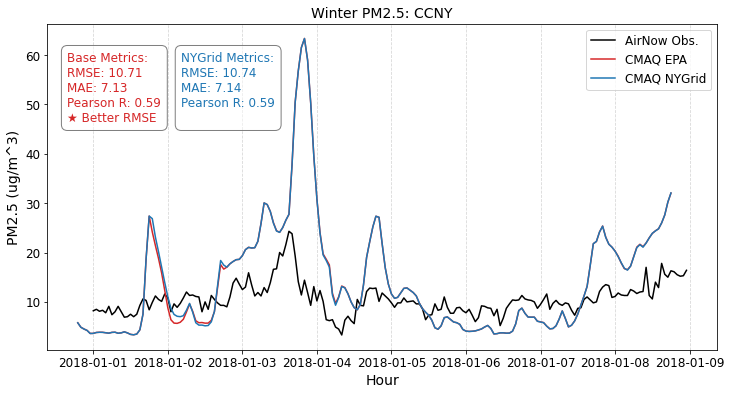

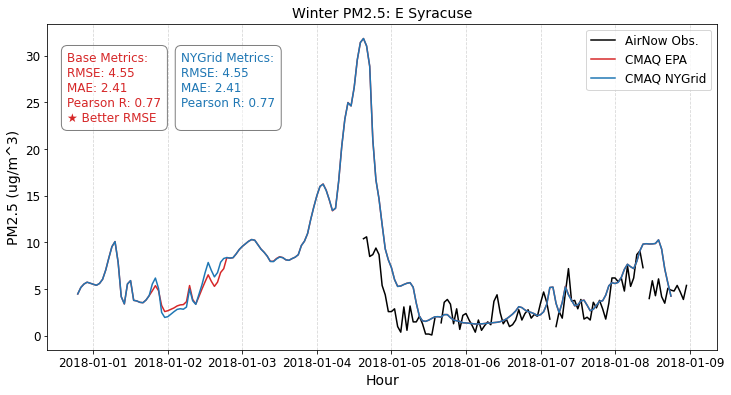

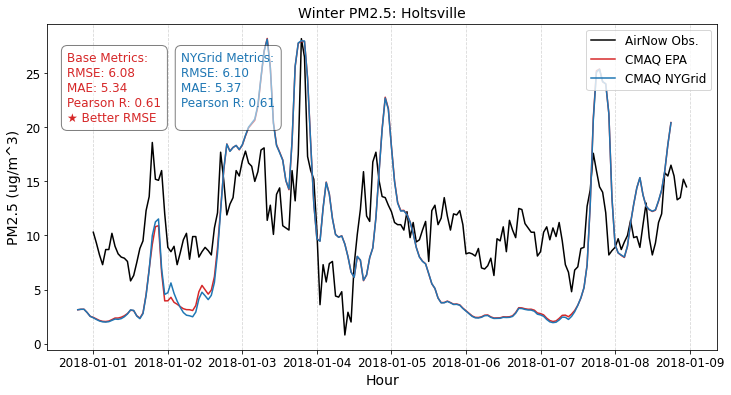

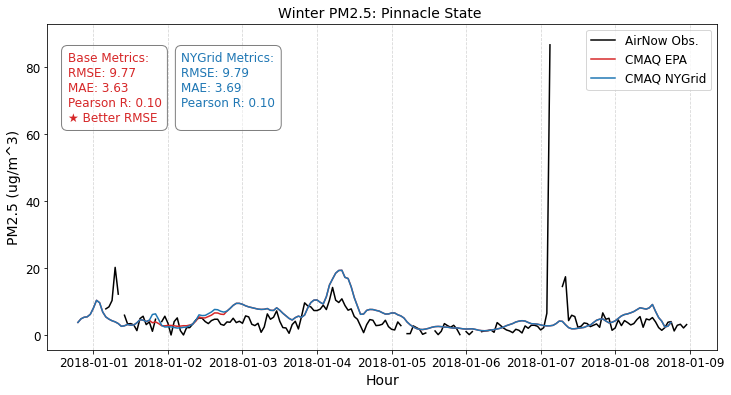

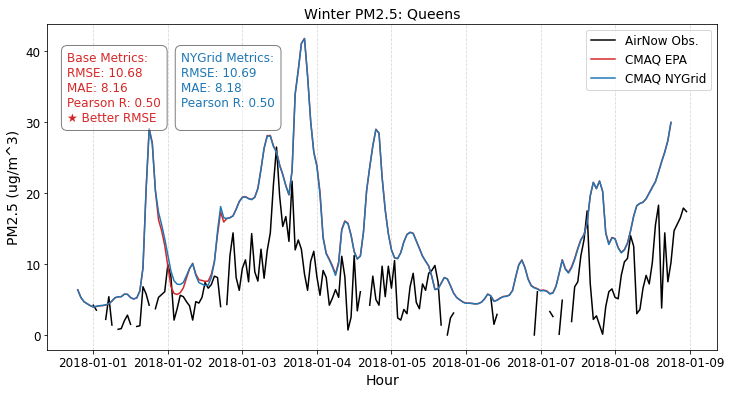

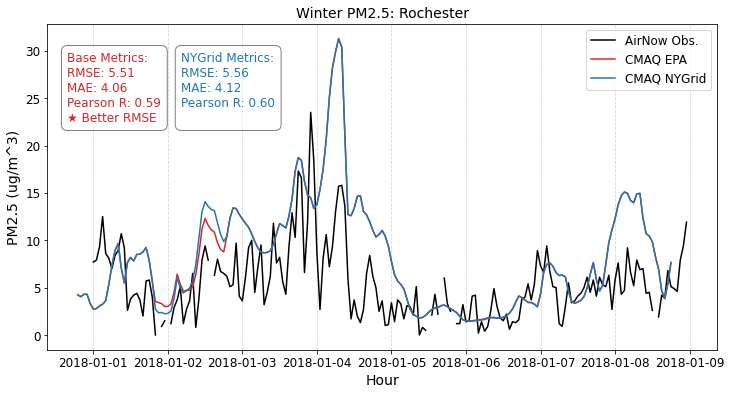

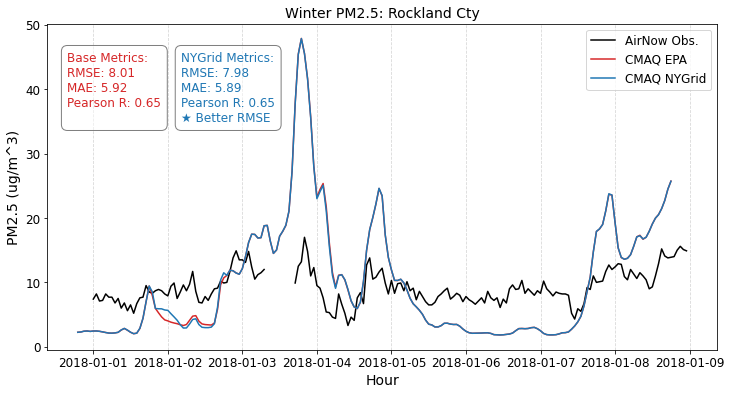

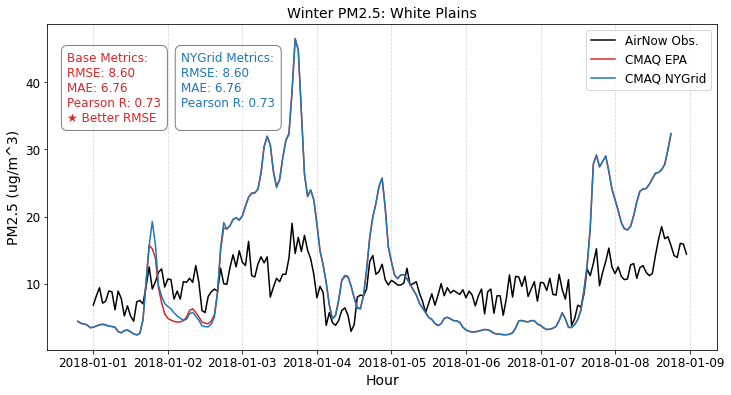

In [14]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_winter_site_data['PM25'][site_name],
                                   cmaq_winter_site_data['PM25'][site_name],
                                   cmaq_winter_nygrid_site_data['PM25'][site_name],
                                   title=f'Winter PM2.5: {site_name}',
                                   xlabel='Hour',
                                   ylabel='PM2.5 (ug/m^3)',
                                   labels=['AirNow Obs.','CMAQ EPA', 'CMAQ NYGrid'],
                                   fontsize=12,
                                   remove_neg=True)

### 1.2. Summer PM2.5

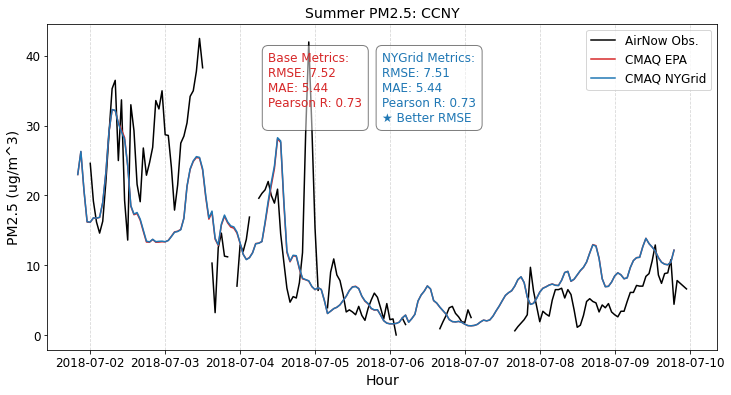

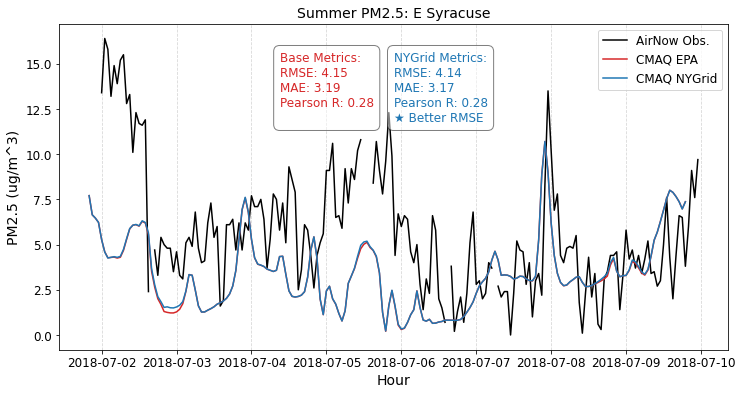

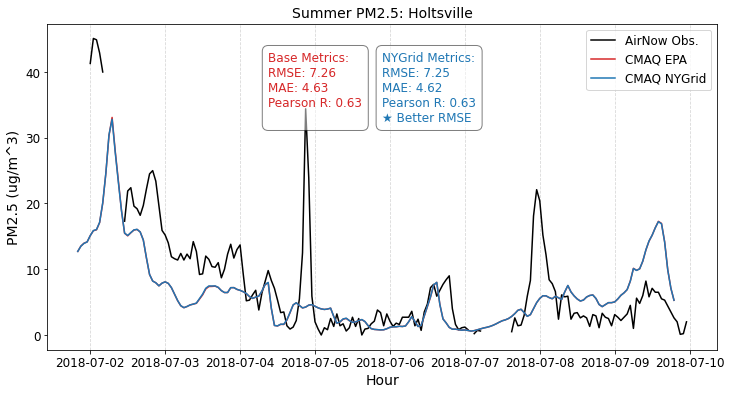

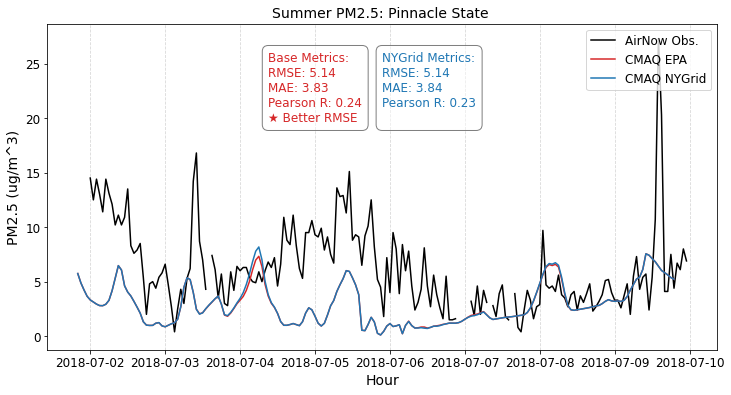

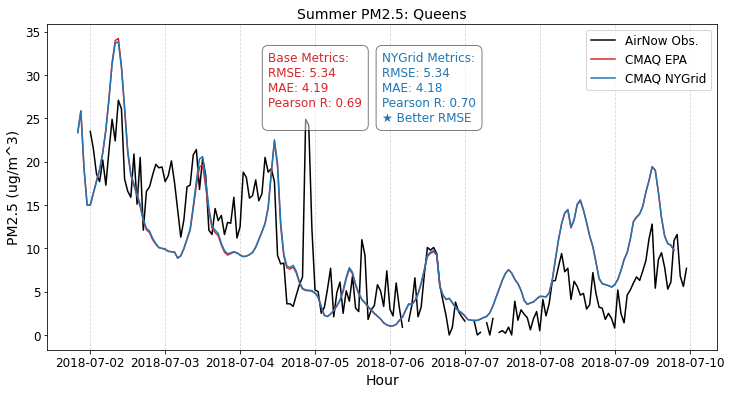

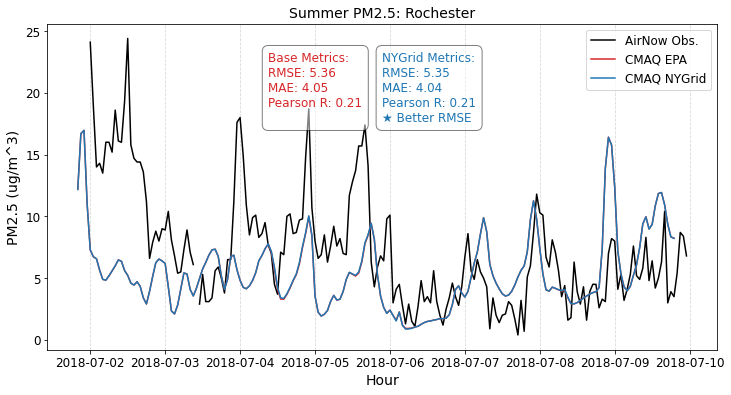

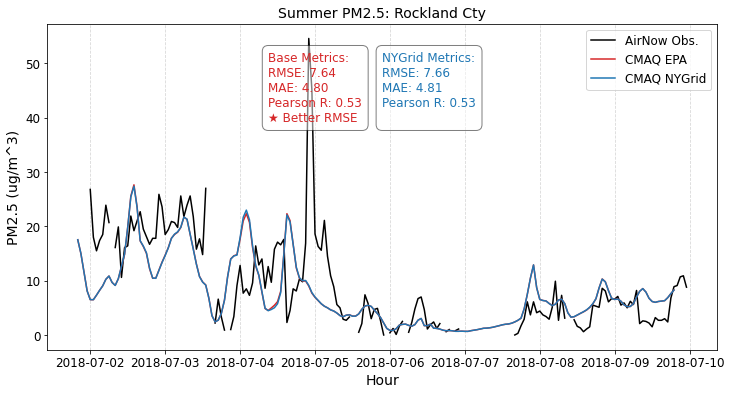

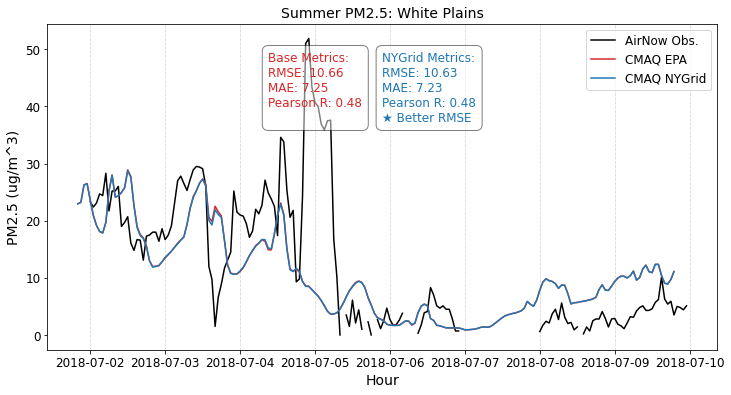

In [15]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_summer_site_data['PM25'][site_name],
                                   cmaq_summer_site_data['PM25'][site_name],
                                   cmaq_summer_nygrid_site_data['PM25'][site_name],
                                   title=f'Summer PM2.5: {site_name}',
                                   xlabel='Hour',
                                   ylabel='PM2.5 (ug/m^3)',
                                   labels=['AirNow Obs.','CMAQ EPA', 'CMAQ NYGrid'],
                                   fontsize=12,
                                   remove_neg=True,
                                   text_1_xy=(0.33, 0.7),
                                   text_2_xy=(0.5, 0.7))

### 2.1. Winter Ozone

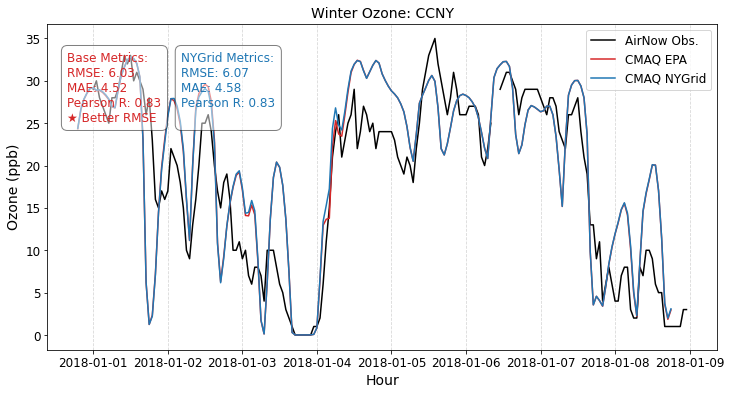

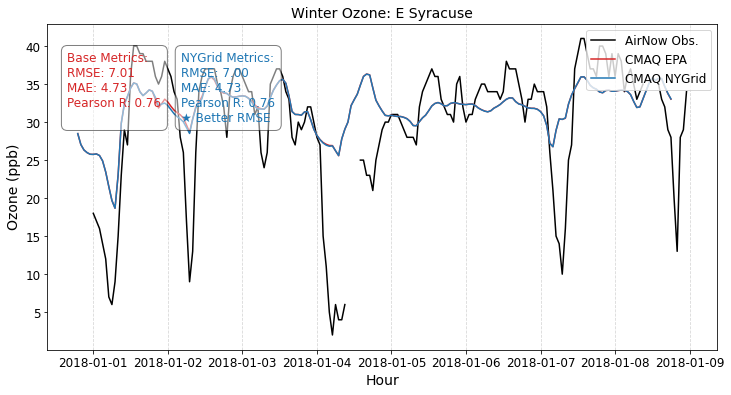

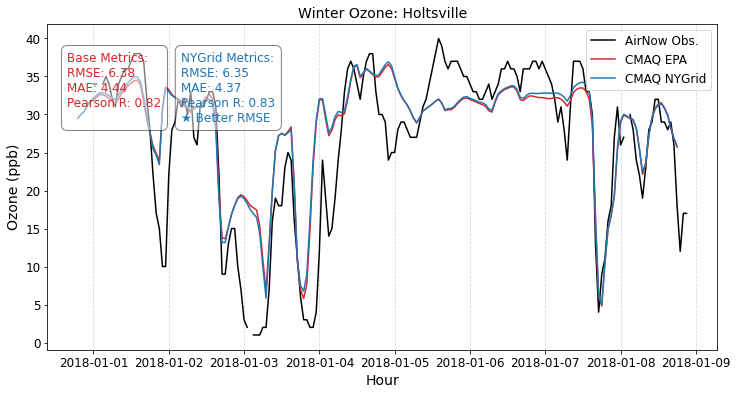

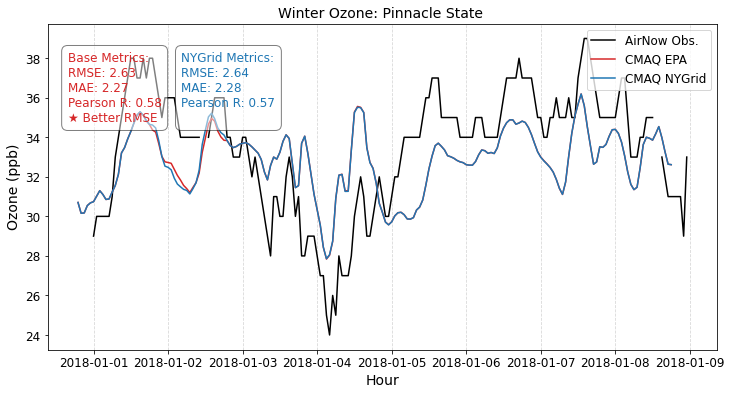

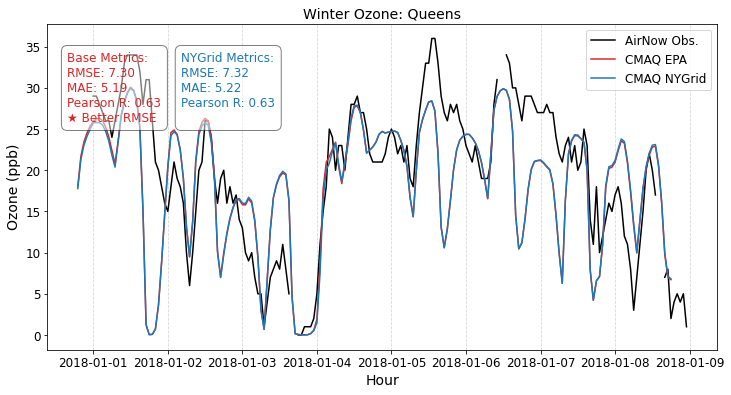

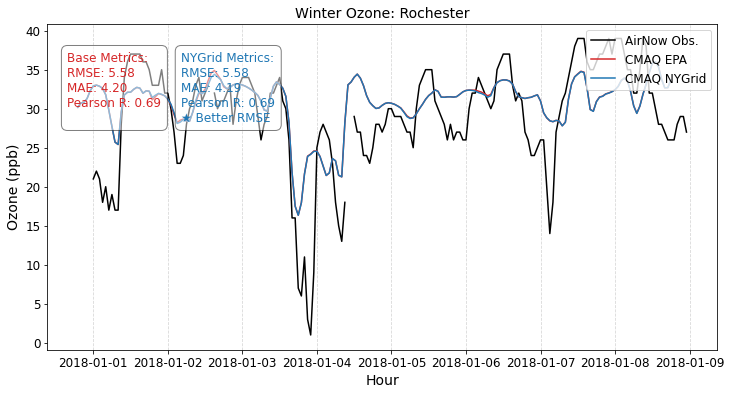

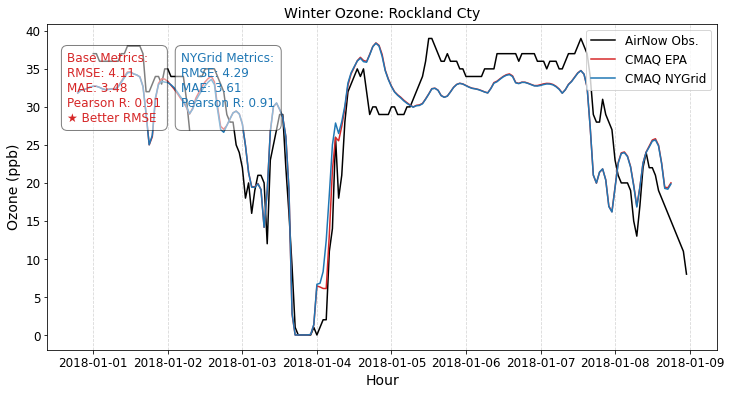

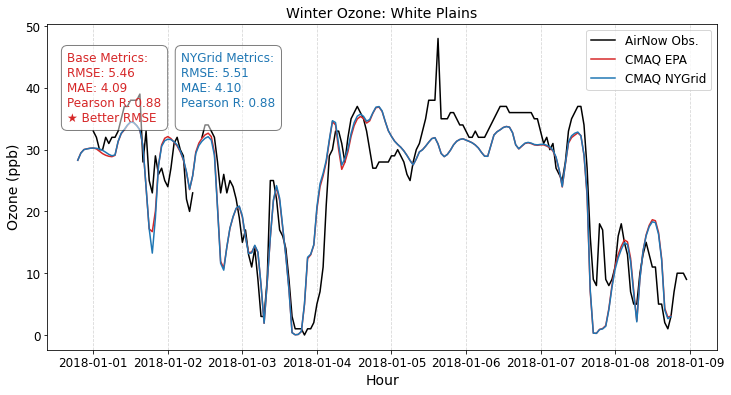

In [16]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_winter_site_data['O3'][site_name],
                                   cmaq_winter_site_data['O3'][site_name],
                                   cmaq_winter_nygrid_site_data['O3'][site_name],
                                   title=f'Winter Ozone: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Ozone (ppb)',
                                   labels=['AirNow Obs.','CMAQ EPA', 'CMAQ NYGrid'],
                                   fontsize=12,
                                   remove_neg=True)

### 2.2. Summer Ozone

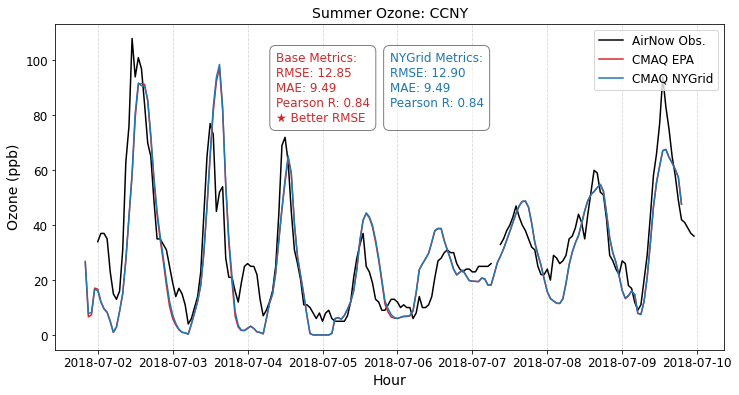

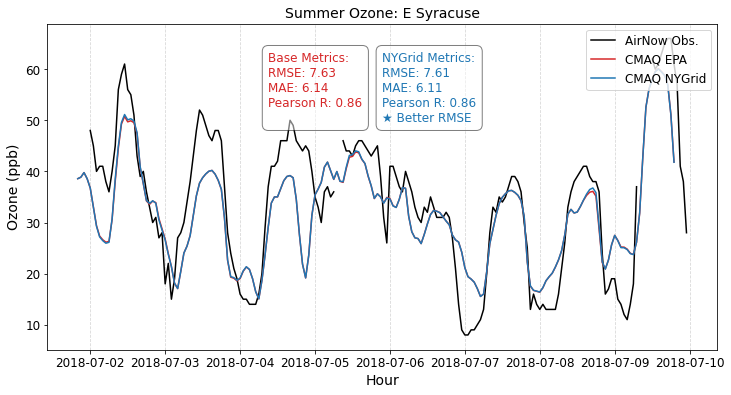

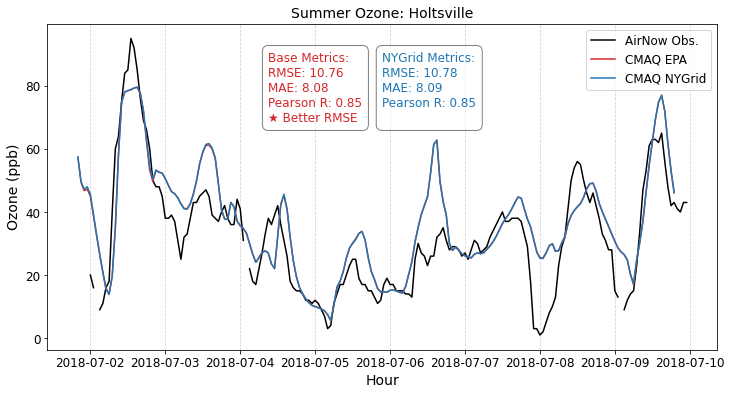

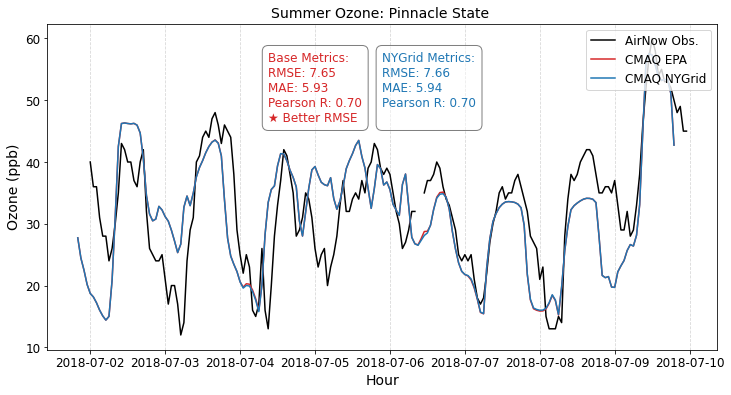

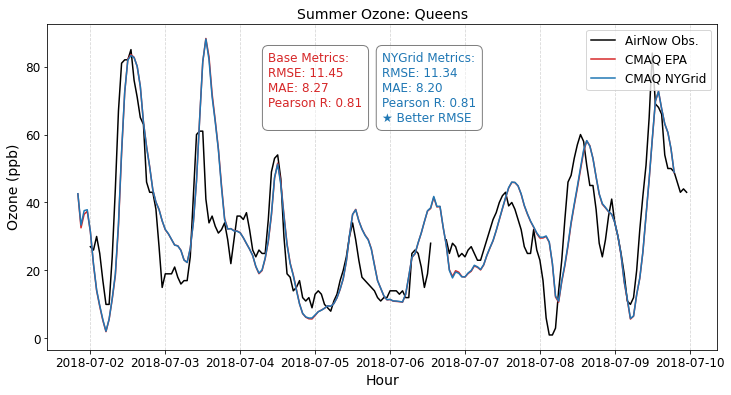

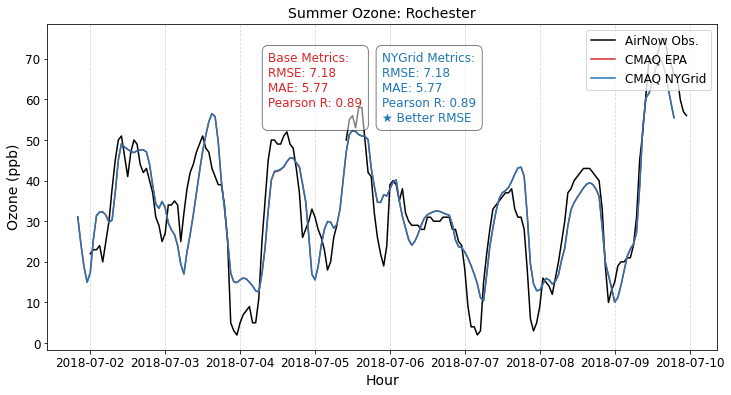

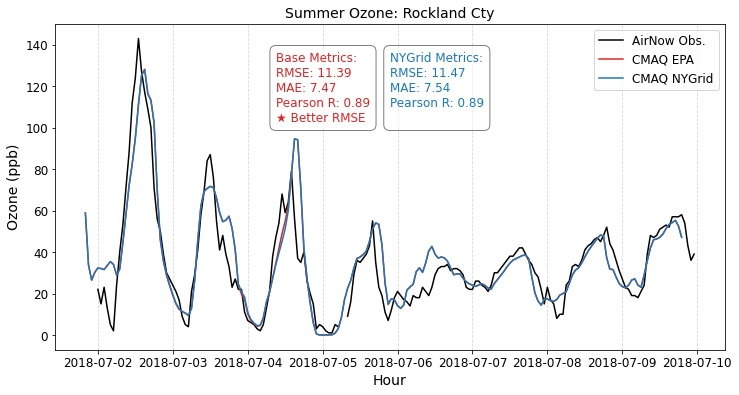

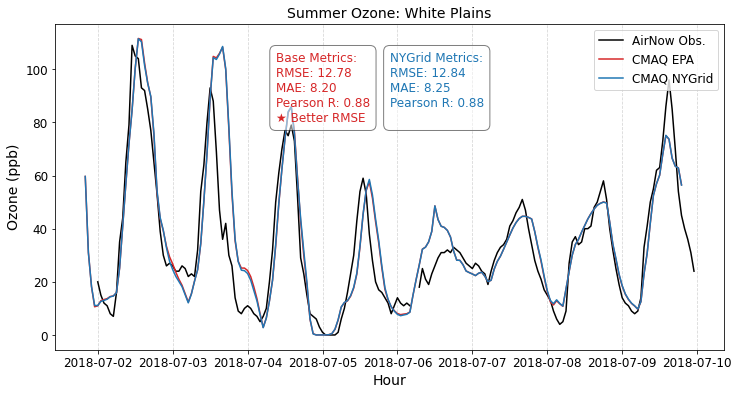

In [17]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_summer_site_data['O3'][site_name],
                                   cmaq_summer_site_data['O3'][site_name],
                                   cmaq_summer_nygrid_site_data['O3'][site_name],
                                   title=f'Summer Ozone: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Ozone (ppb)',
                                   labels=['AirNow Obs.','CMAQ EPA', 'CMAQ NYGrid'],
                                   fontsize=12,
                                   remove_neg=True,
                                   text_1_xy=(0.33, 0.7),
                                   text_2_xy=(0.5, 0.7))

### 3.1. Winter temperature

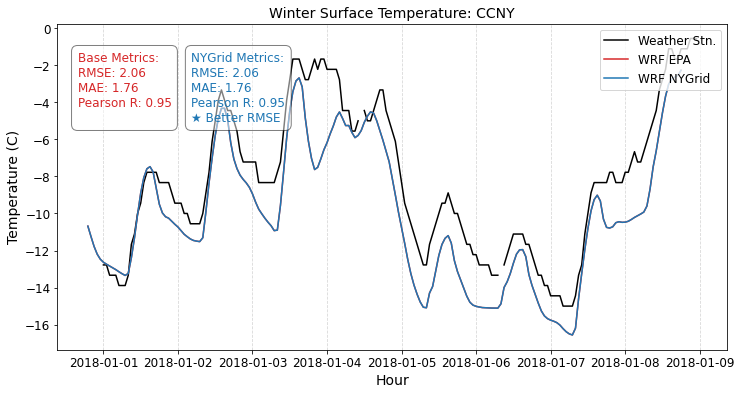

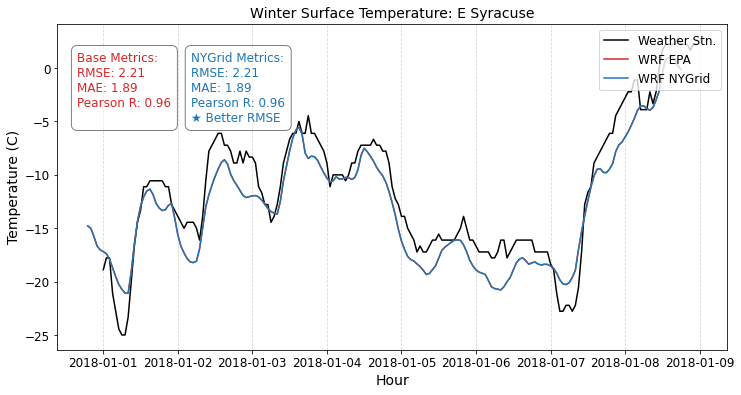

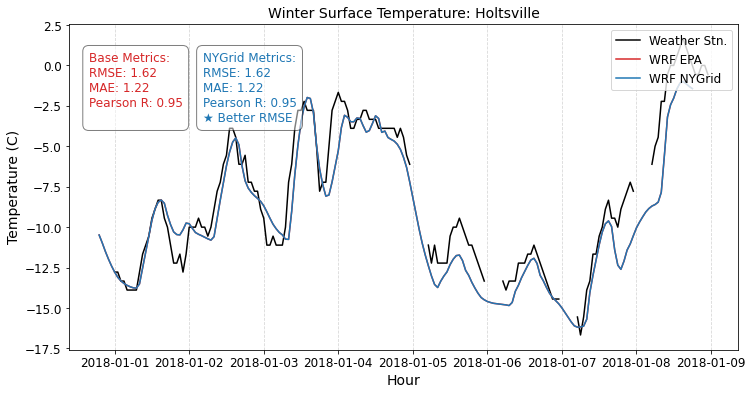

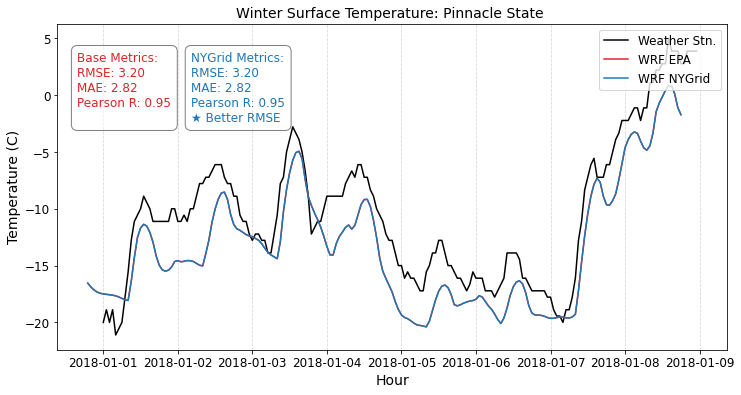

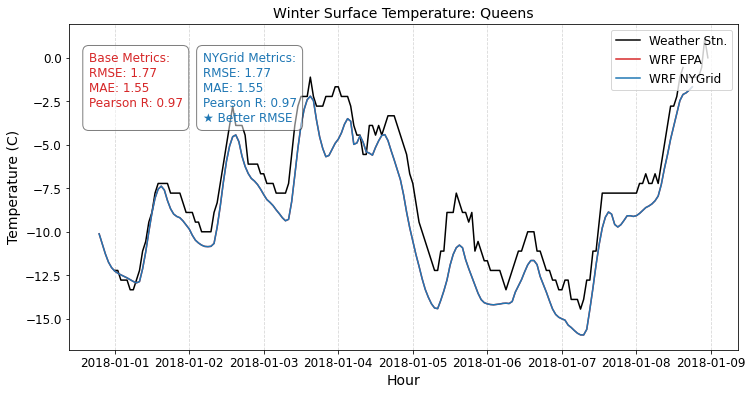

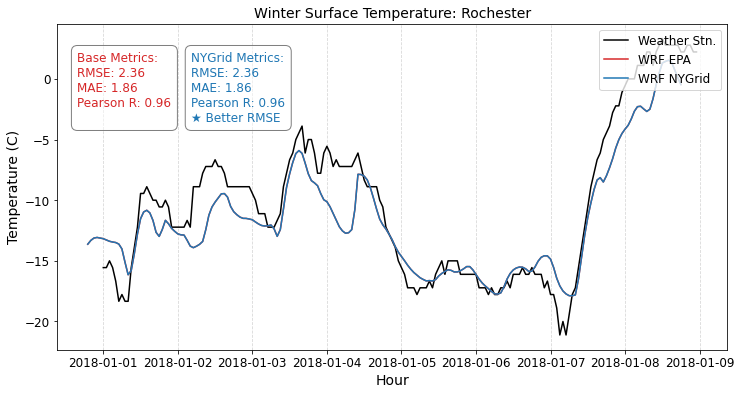

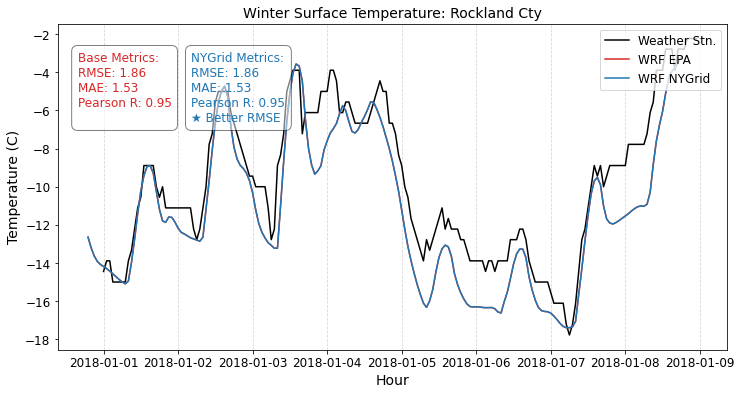

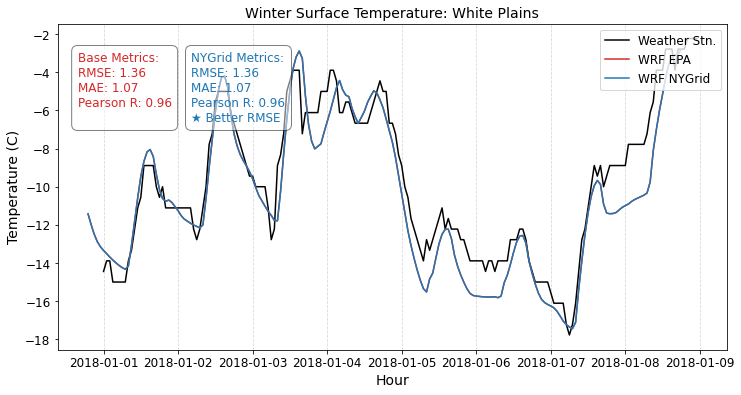

In [18]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_winter_site_data['temperature'][site_name],
                                   cmaq_winter_site_data['SFC_TMP'][site_name],
                                   cmaq_winter_nygrid_site_data['SFC_TMP'][site_name],
                                   title=f'Winter Surface Temperature: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Temperature (C)',
                                   labels=['Weather Stn.','WRF EPA', 'WRF NYGrid'],
                                   fontsize=12)

### 3.2. Summer temperature

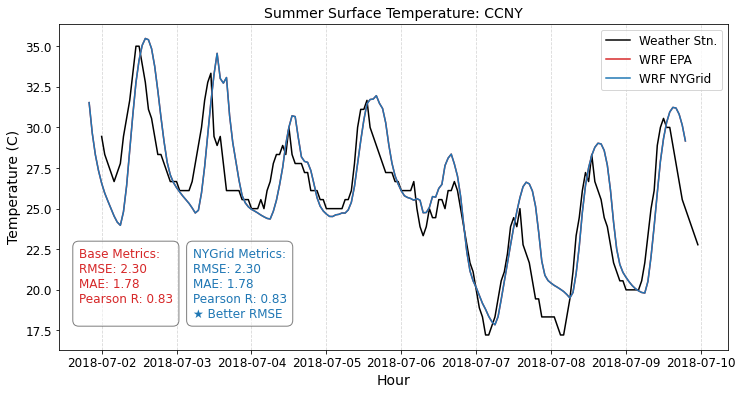

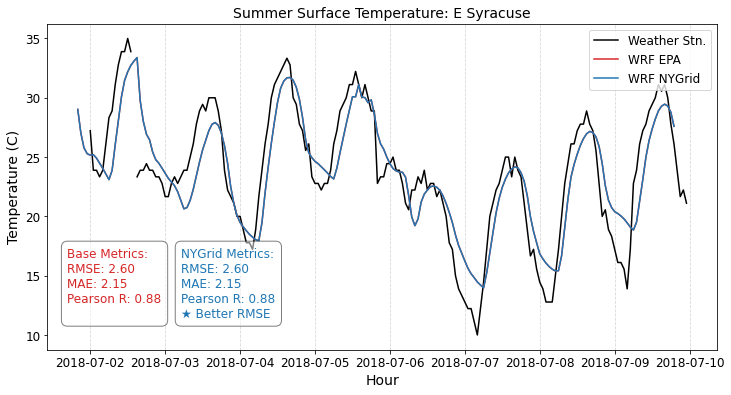

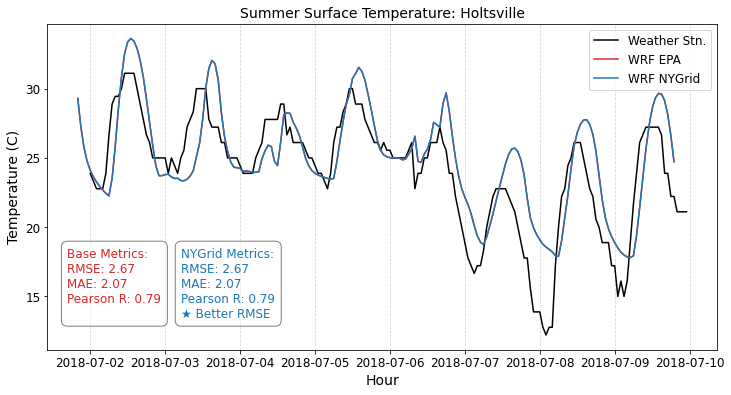

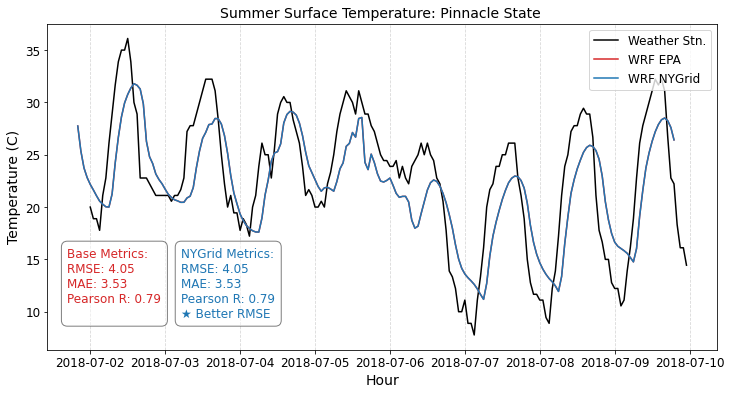

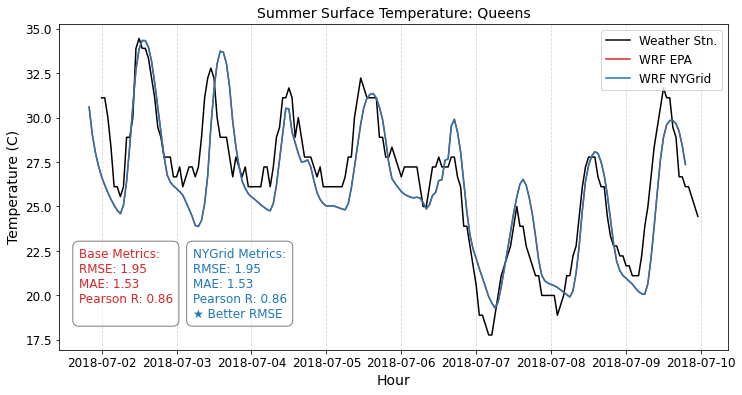

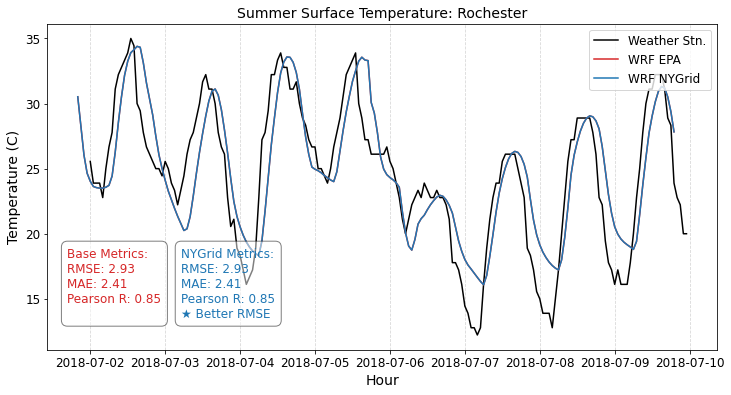

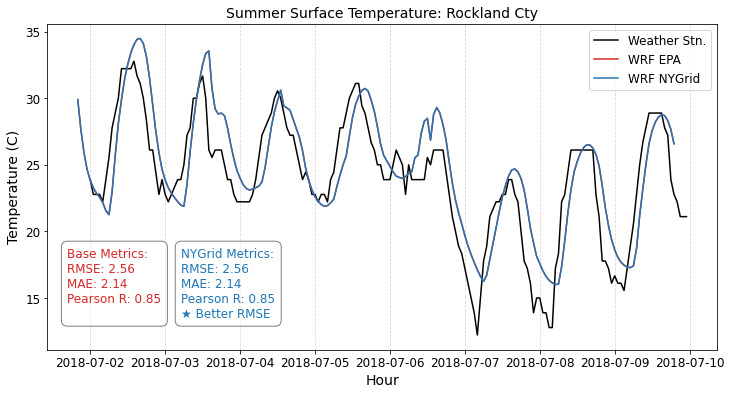

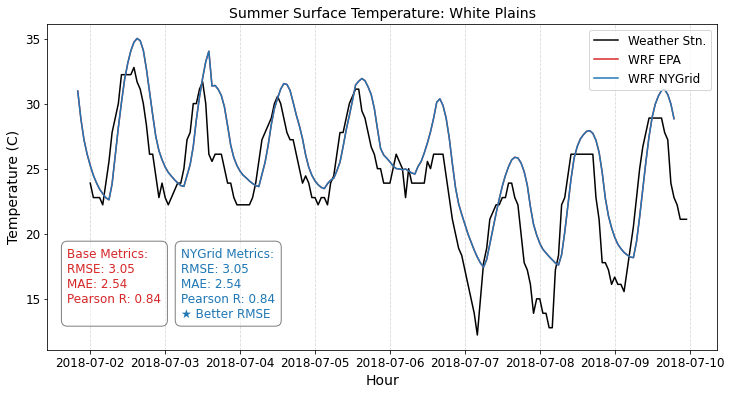

In [19]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_summer_site_data['temperature'][site_name],
                                   cmaq_summer_site_data['SFC_TMP'][site_name],
                                   cmaq_summer_nygrid_site_data['SFC_TMP'][site_name],
                                   title=f'Summer Surface Temperature: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Temperature (C)',
                                   labels=['Weather Stn.','WRF EPA', 'WRF NYGrid'],
                                   fontsize=12,
                                   text_1_xy=(0.03, 0.1),
                                   text_2_xy=(0.2, 0.1))

### 4.1. Winter solar radiation

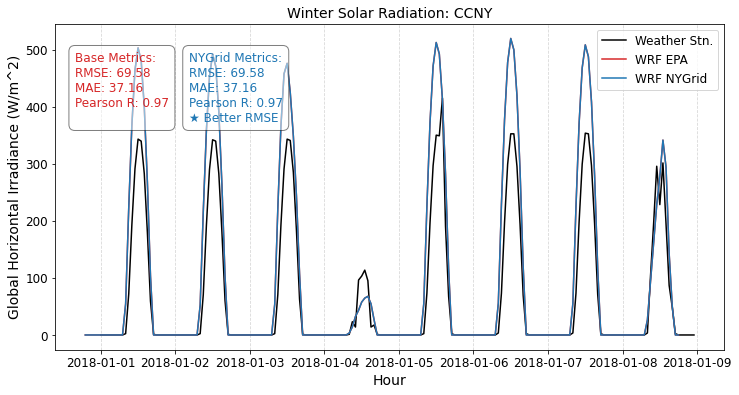

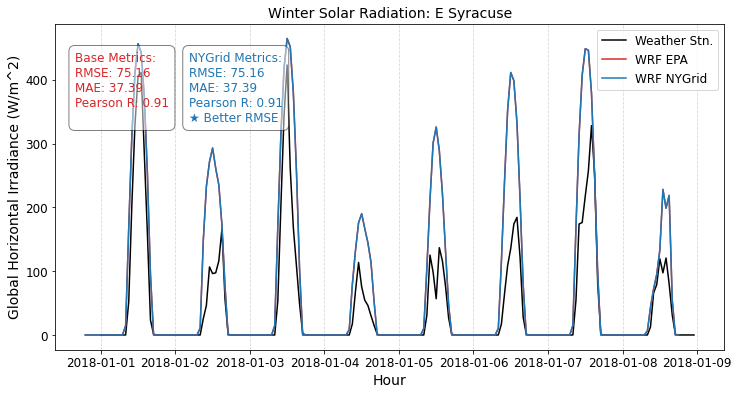

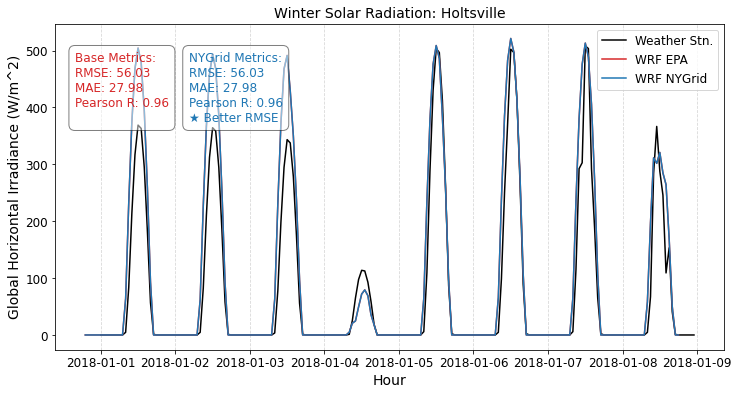

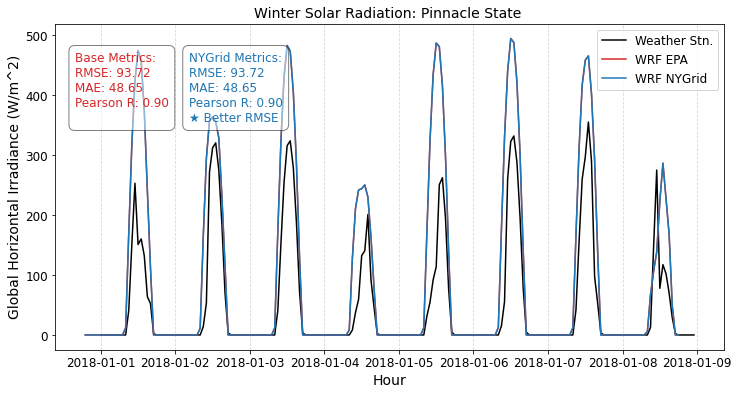

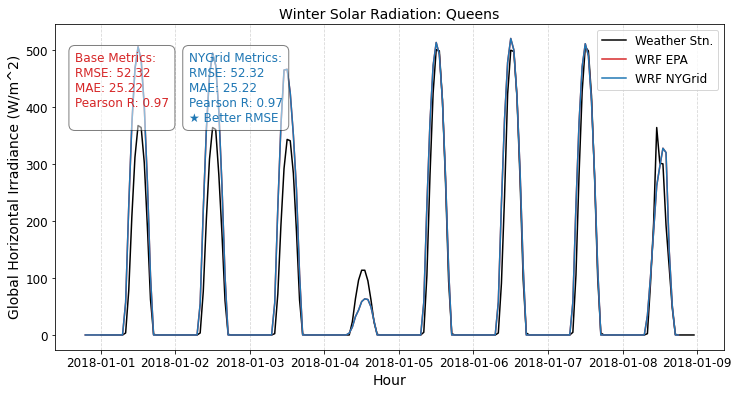

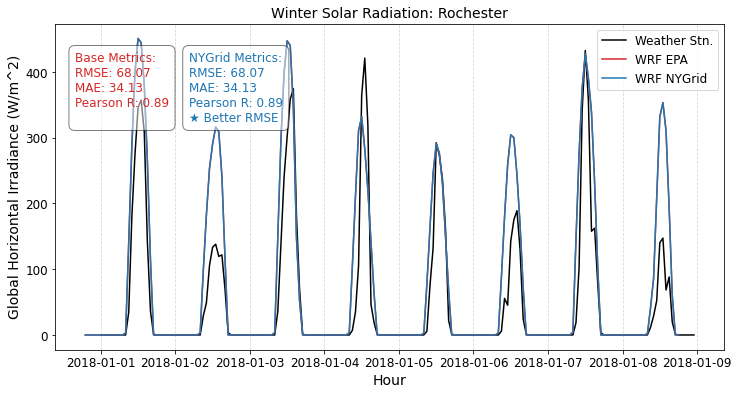

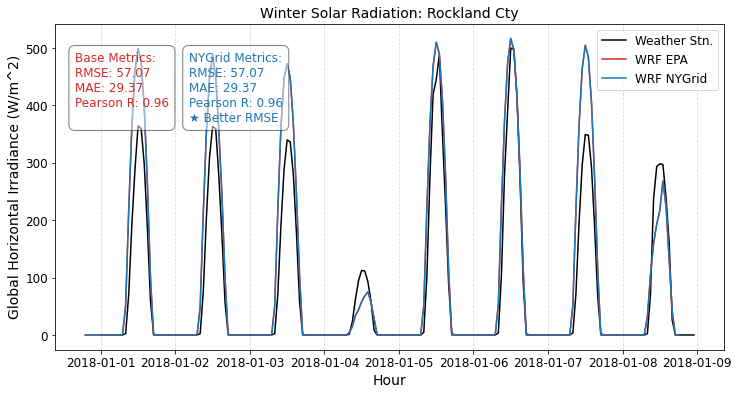

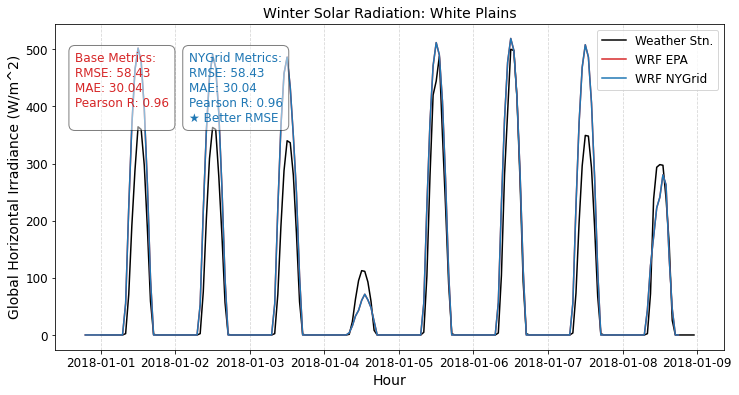

In [20]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_winter_site_data['solar radiation'][site_name],
                                   cmaq_winter_site_data['SOL_RAD'][site_name],
                                   cmaq_winter_nygrid_site_data['SOL_RAD'][site_name],
                                   title=f'Winter Solar Radiation: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Global Horizontal Irradiance (W/m^2)',
                                   labels=['Weather Stn.','WRF EPA', 'WRF NYGrid'],
                                   fontsize=12)

### 4.2. Summer solar radiation

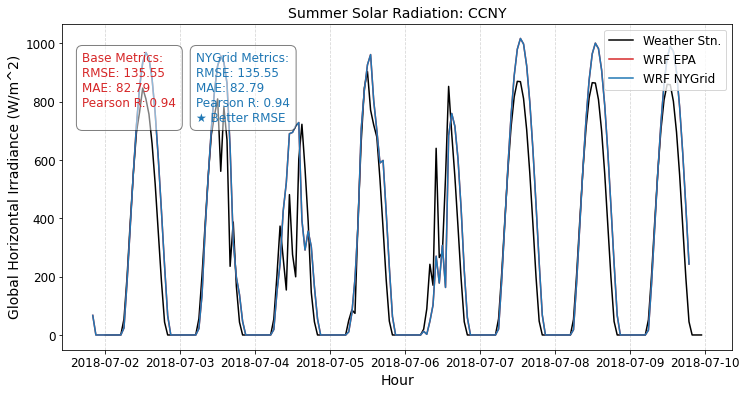

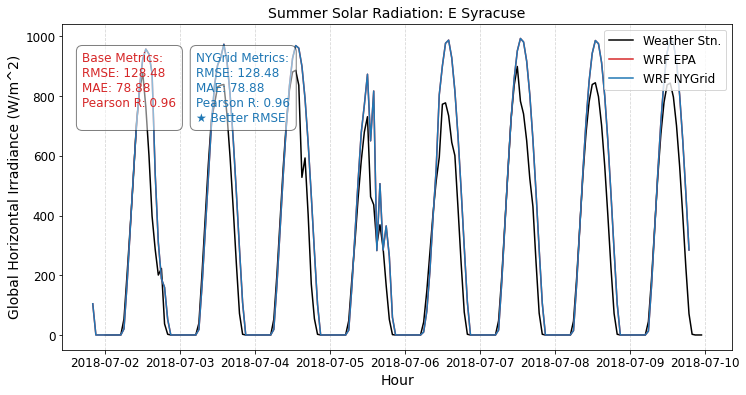

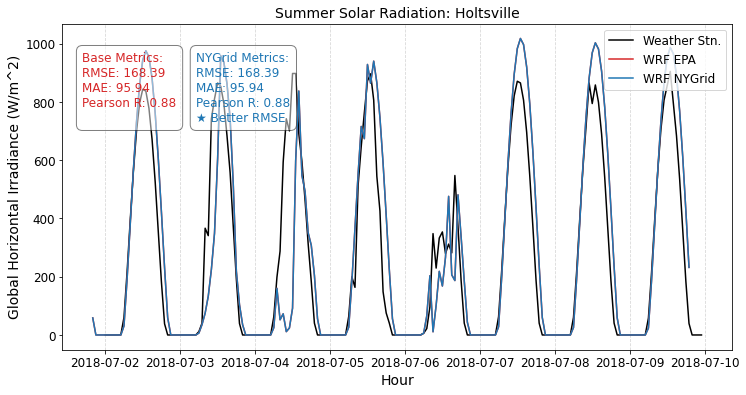

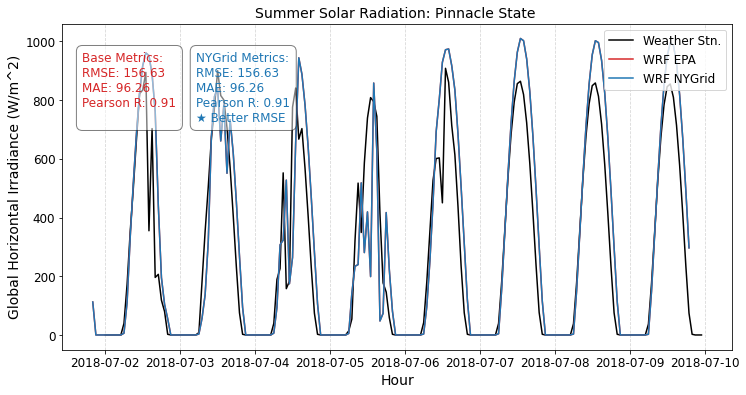

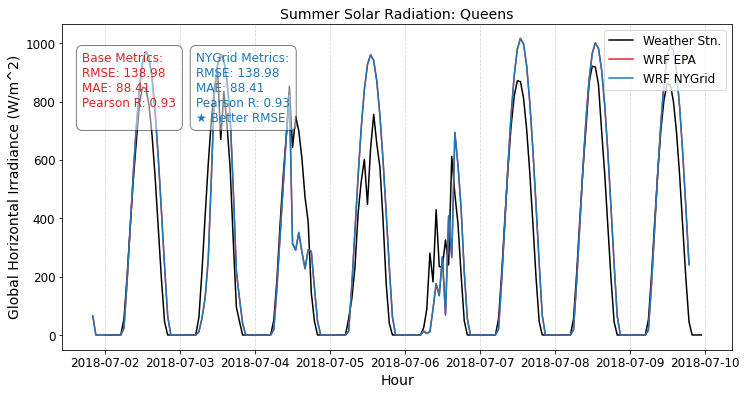

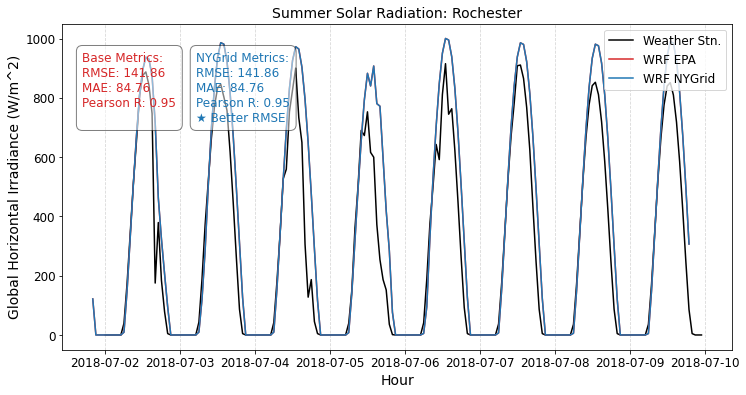

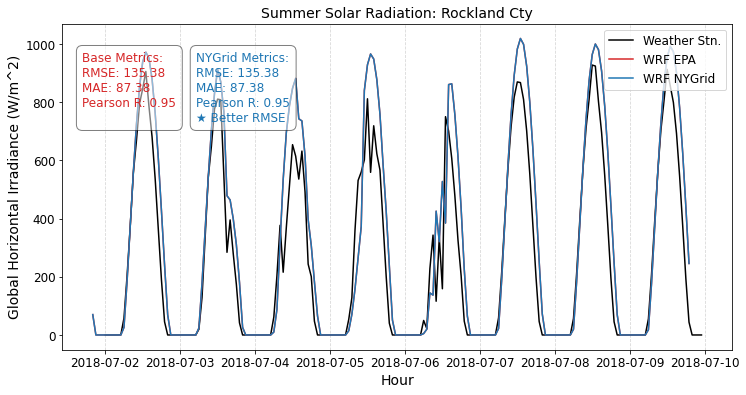

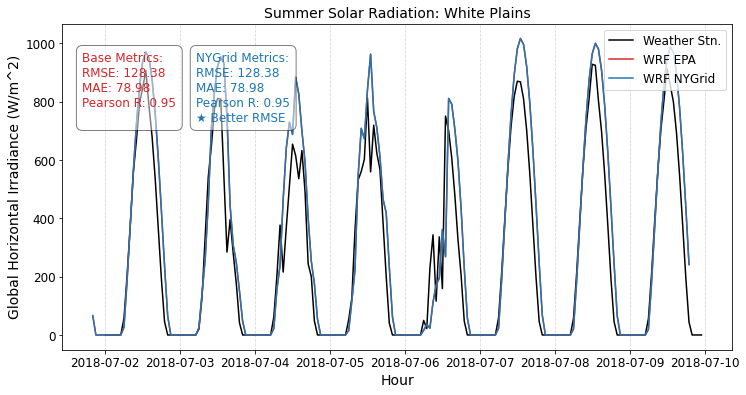

In [21]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_summer_site_data['solar radiation'][site_name],
                                   cmaq_summer_site_data['SOL_RAD'][site_name],
                                   cmaq_summer_nygrid_site_data['SOL_RAD'][site_name],
                                   title=f'Summer Solar Radiation: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Global Horizontal Irradiance (W/m^2)',
                                   labels=['Weather Stn.','WRF EPA', 'WRF NYGrid'],
                                   fontsize=12)

### 5.1. Winter wind speed

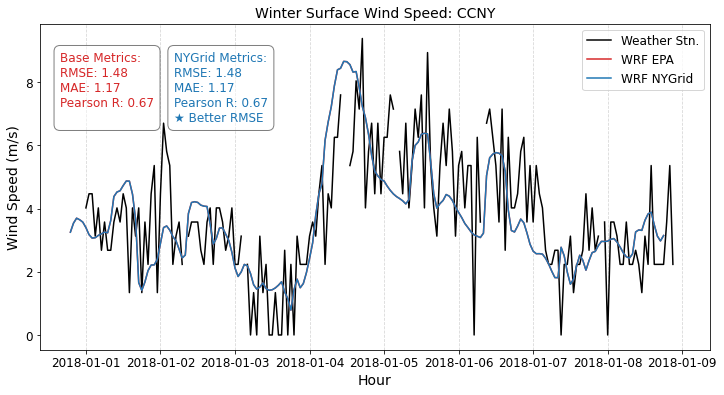

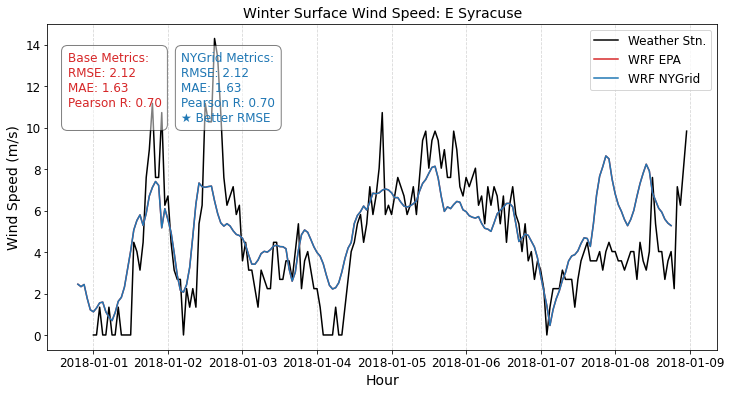

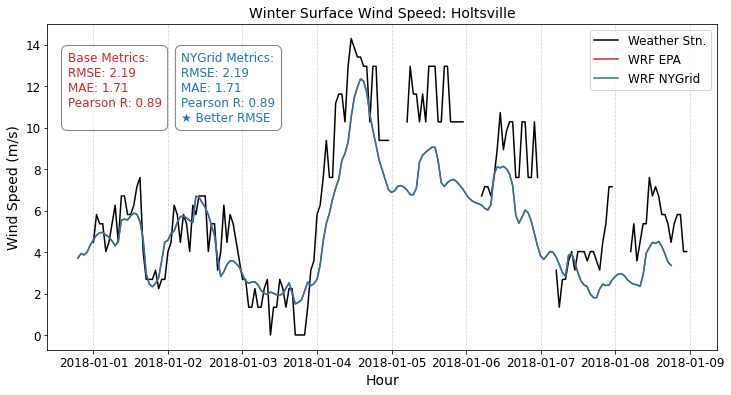

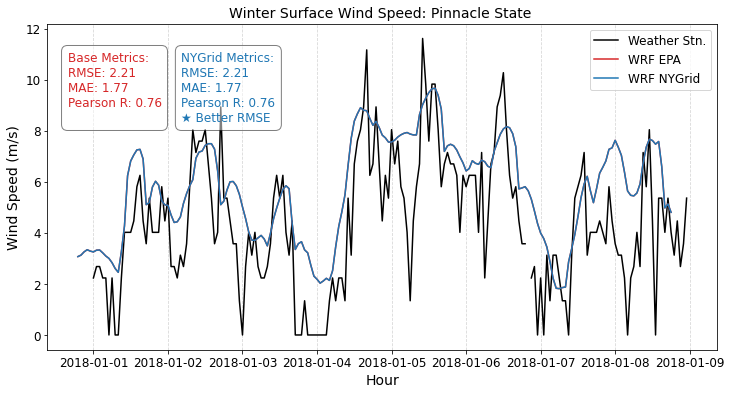

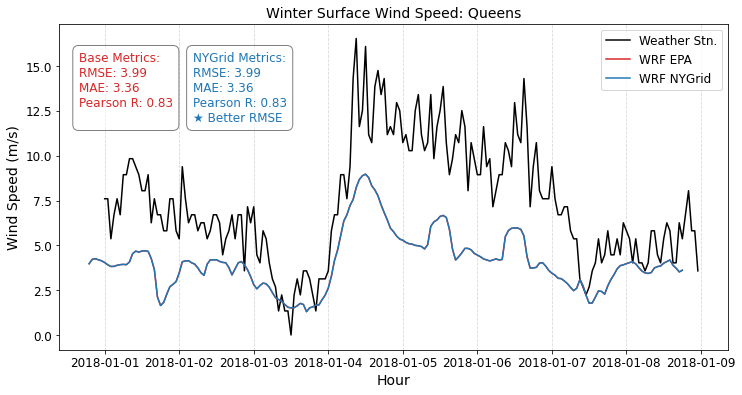

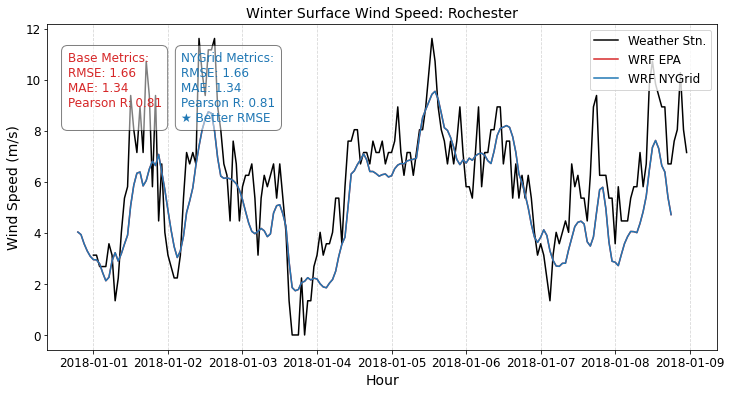

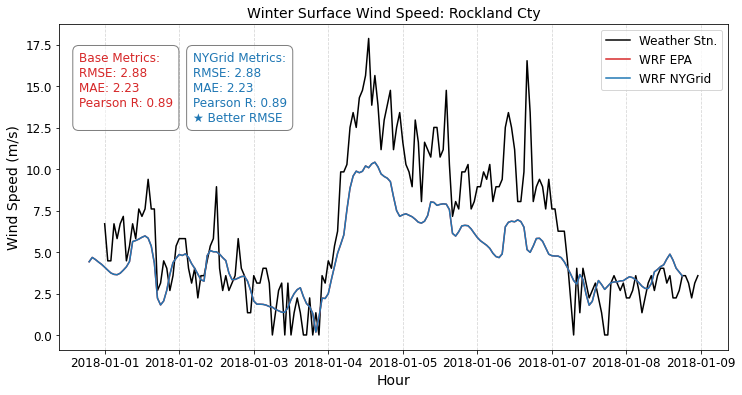

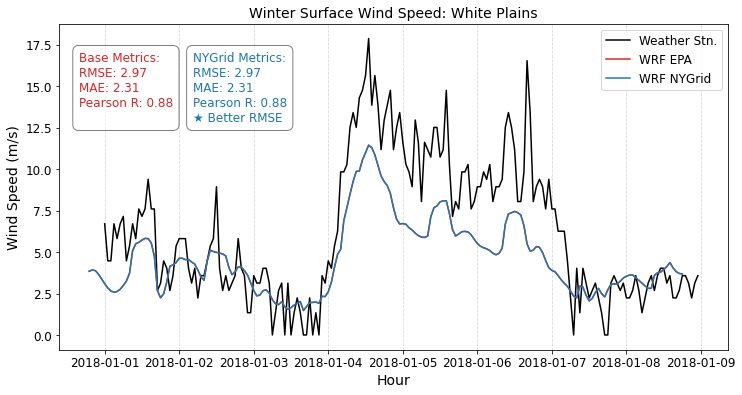

In [22]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_winter_site_data['wind speed'][site_name],
                                   cmaq_winter_site_data['WSPD10'][site_name],
                                   cmaq_winter_nygrid_site_data['WSPD10'][site_name],
                                   title=f'Winter Surface Wind Speed: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Wind Speed (m/s)',
                                   labels=['Weather Stn.','WRF EPA', 'WRF NYGrid'],
                                   fontsize=12)

### 5.2. Summer wind speed

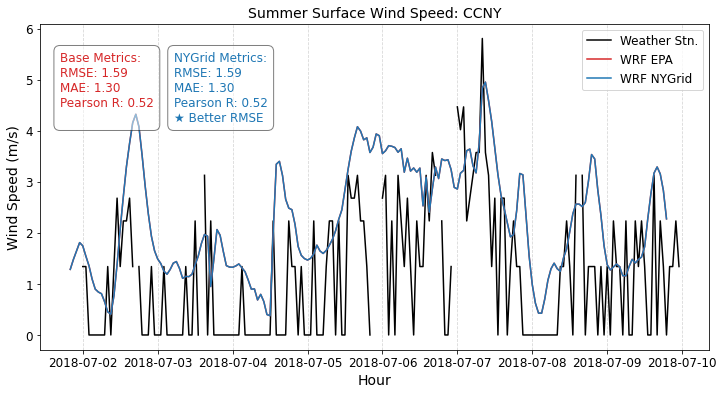

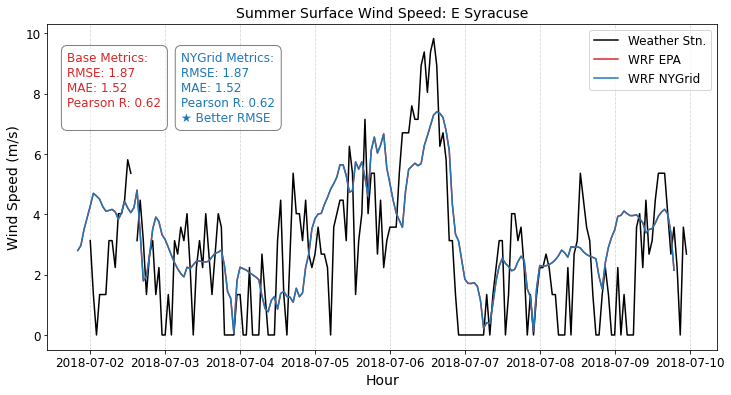

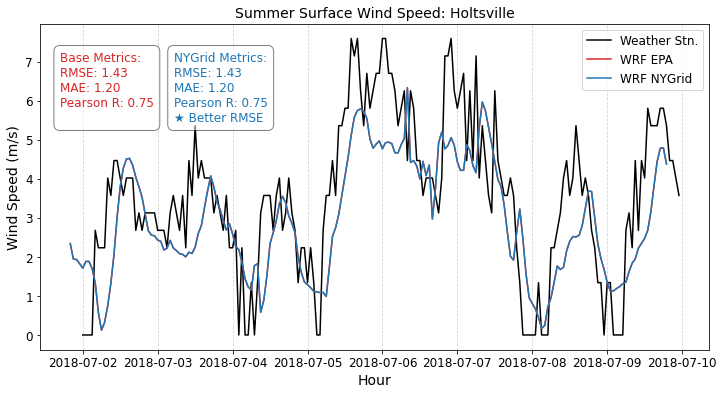

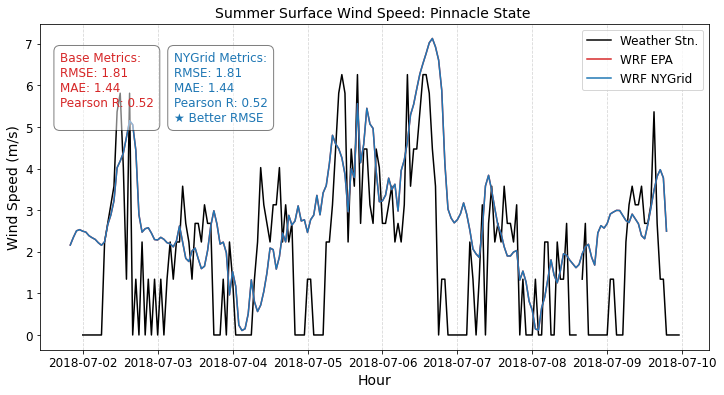

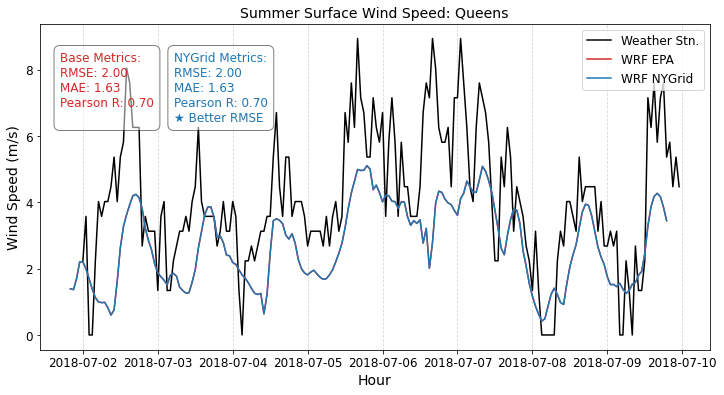

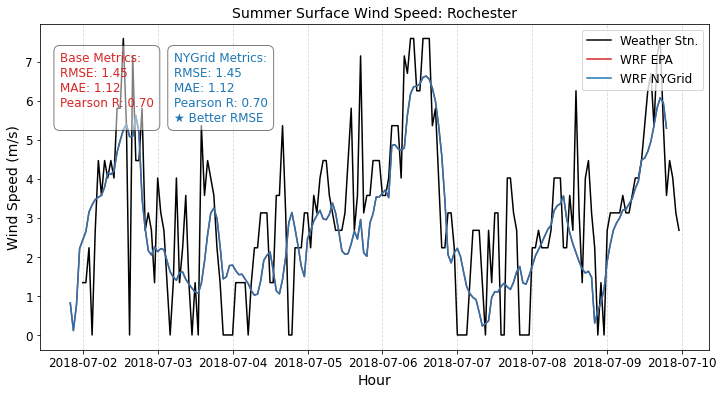

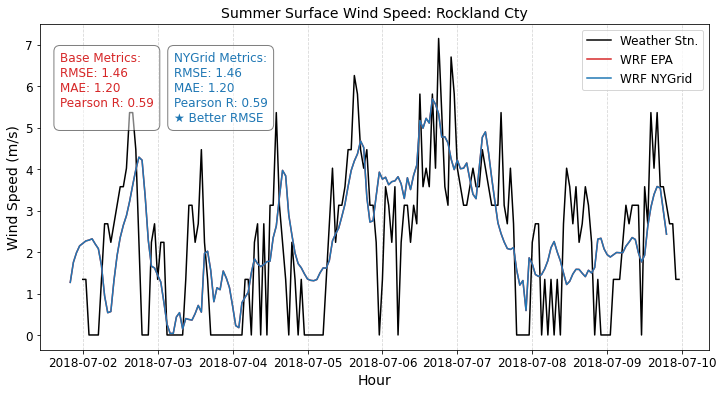

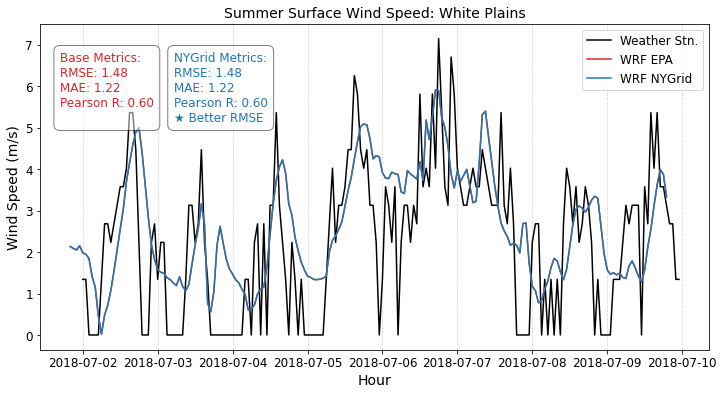

In [23]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_summer_site_data['wind speed'][site_name],
                                   cmaq_summer_site_data['WSPD10'][site_name],
                                   cmaq_summer_nygrid_site_data['WSPD10'][site_name],
                                   title=f'Summer Surface Wind Speed: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Wind Speed (m/s)',
                                   labels=['Weather Stn.','WRF EPA', 'WRF NYGrid'],
                                   fontsize=12)

### 6.1. Winter relative humidity

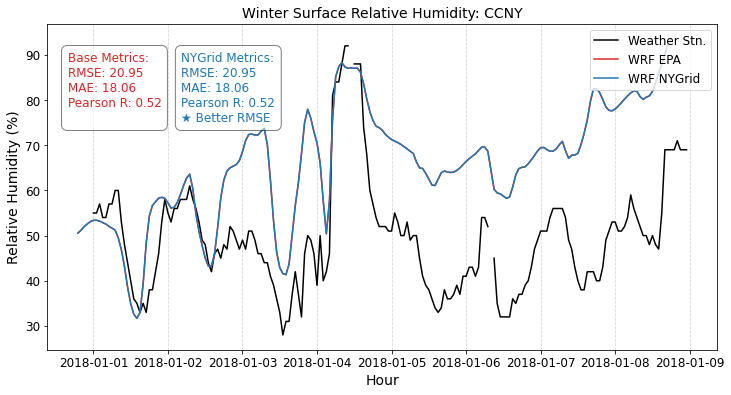

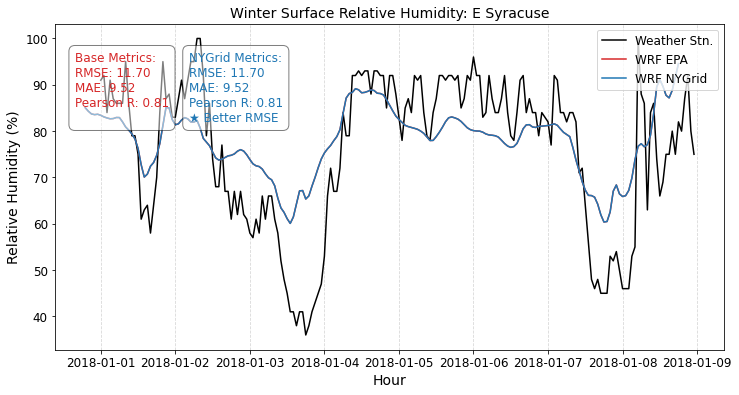

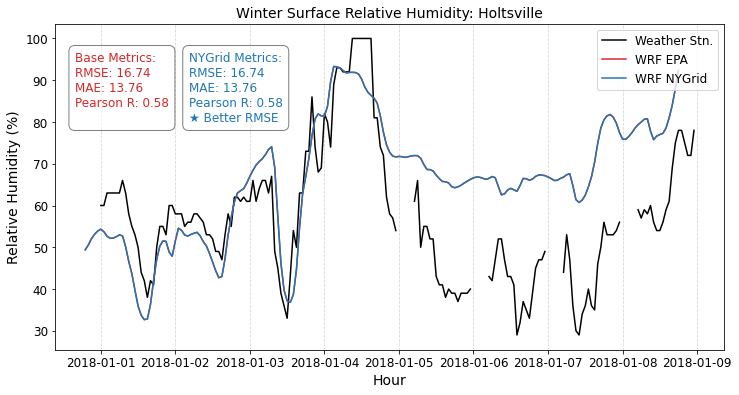

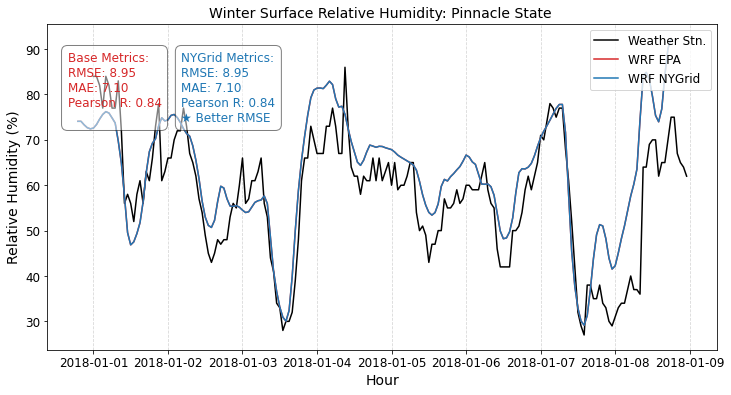

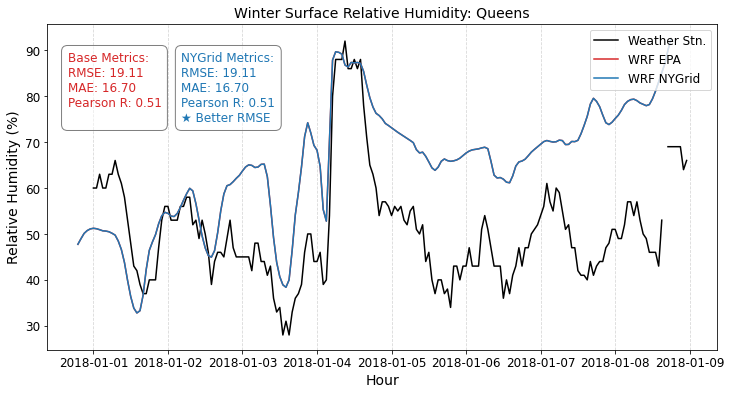

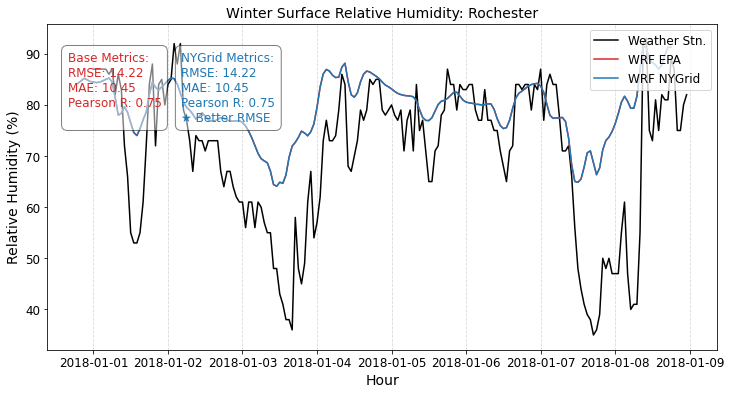

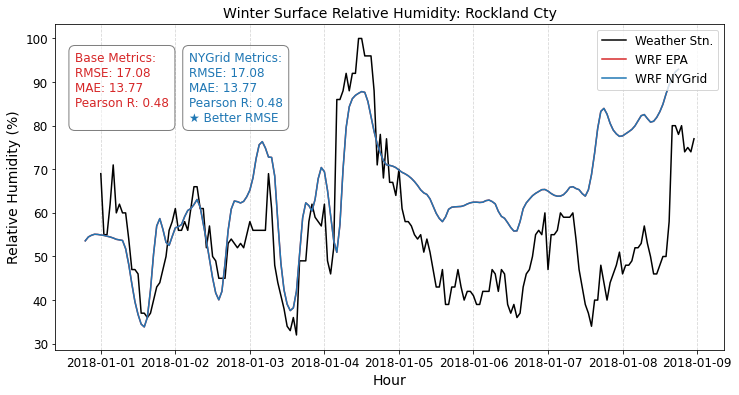

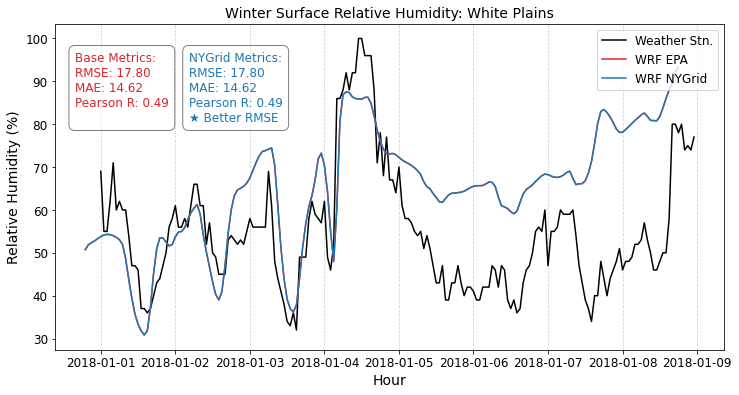

In [24]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_winter_site_data['relative humidity'][site_name],
                                   cmaq_winter_site_data['RH'][site_name],
                                   cmaq_winter_nygrid_site_data['RH'][site_name],
                                   title=f'Winter Surface Relative Humidity: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Relative Humidity (%)',
                                   labels=['Weather Stn.','WRF EPA', 'WRF NYGrid'],
                                   fontsize=12)

### 6.2. Summer relative humidity

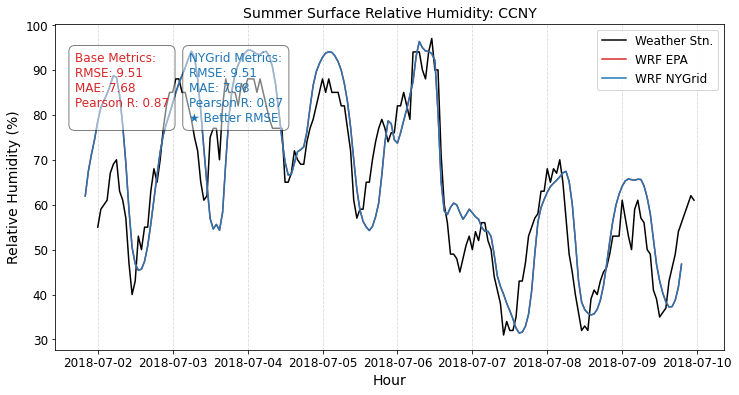

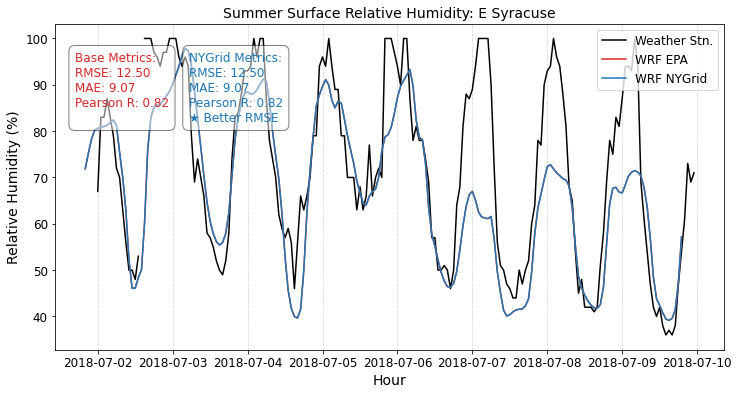

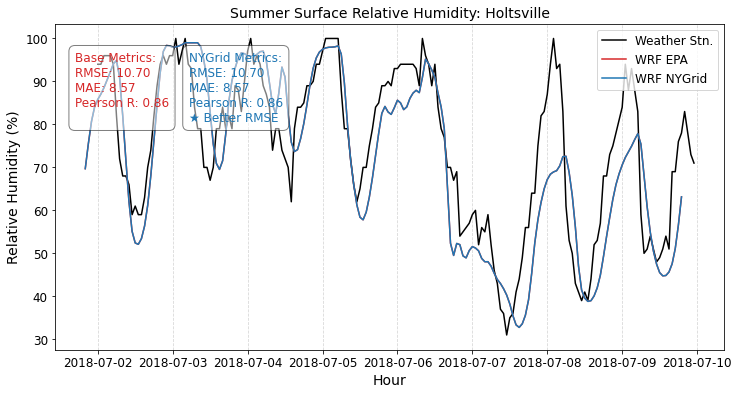

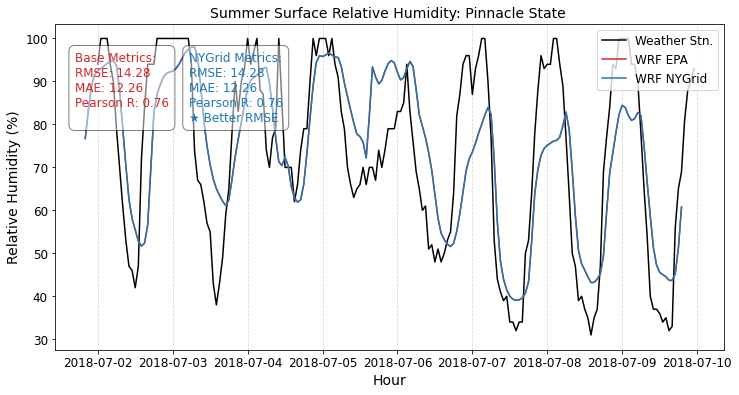

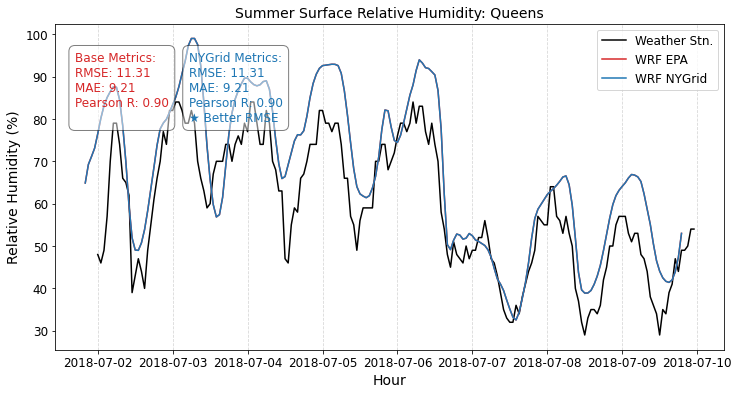

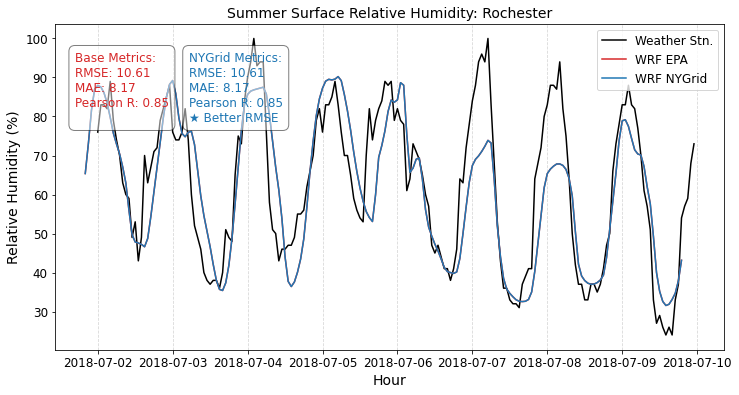

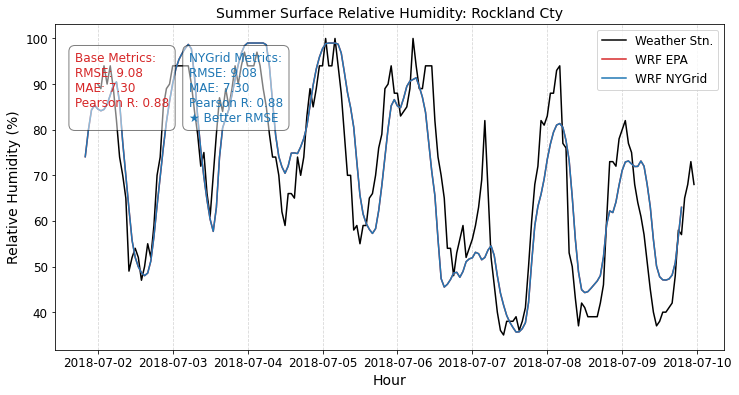

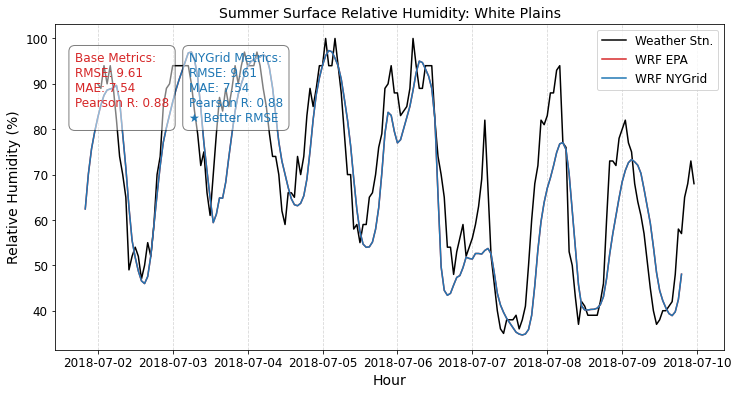

In [25]:
for site_name in site_names:
    fig, ax = plot_site_comparison(airnow_summer_site_data['relative humidity'][site_name],
                                   cmaq_summer_site_data['RH'][site_name],
                                   cmaq_summer_nygrid_site_data['RH'][site_name],
                                   title=f'Summer Surface Relative Humidity: {site_name}',
                                   xlabel='Hour',
                                   ylabel='Relative Humidity (%)',
                                   labels=['Weather Stn.','WRF EPA', 'WRF NYGrid'],
                                   fontsize=12)

## 2. Maps

In [26]:
import cartopy

bottem_left_lon = -85.0
top_right_lon = -65.0
bottem_left_lat = 38.0
top_right_lat = 48.0

closer_bounds = ccrs.transform_points(cartopy.crs.PlateCarree(),
                        np.array([bottem_left_lon, top_right_lon]),
                        np.array([bottem_left_lat, top_right_lat]))

### 1.1. Winter PM2.5

In [27]:
# Get the plot variables
pm25_winter_mean_base = conc_winter_base['PM25_TOT'].mean(dim='time').squeeze()
pm25_winter_mean_nygrid = conc_winter_nygrid['PM25_TOT'].mean(dim='time').squeeze()
pm25_winter_mean_diff = (conc_winter_nygrid['PM25_TOT'] - conc_winter_base['PM25_TOT']).mean(dim='time').squeeze()
pm25_winter_mean_pct_diff = ((conc_winter_nygrid['PM25_TOT'] - conc_winter_base['PM25_TOT']) 
                      / conc_winter_base['PM25_TOT'] * 100).mean(dim='time').squeeze()

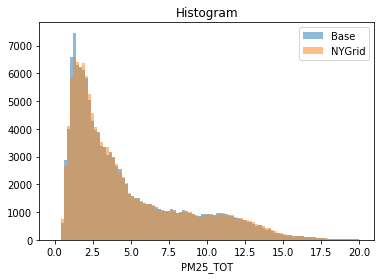

In [28]:
pm25_winter_mean_base.plot.hist(bins=100, range=(0, 20), label='Base', alpha=0.5)
pm25_winter_mean_nygrid.plot.hist(bins=100, range=(0, 20), label='NYGrid', alpha=0.5)
plt.legend()
plt.show()

/home/by276/anaconda3/envs/optwrf_new/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1598: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  shading=shading)


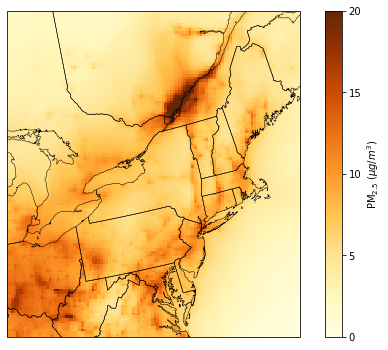

In [94]:
# EPA 2018 winter PM2.5 mean
plots.conc_map(pm25_winter_mean_base, cmap=cm.get_cmap('YlOrBr'),
               figsize=(9, 6), ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=0, vmax=20,
               cbar_args={
                   "cbar_ticks": [0, 5, 10, 15, 20],
                    "cbar_label": 'PM$_{2.5}$ ($\mu g/m^{3}$)'
                },
               savefig=False,
               figpath='../cmaqpy/data/plots/winter_pm25_mean_base.png')

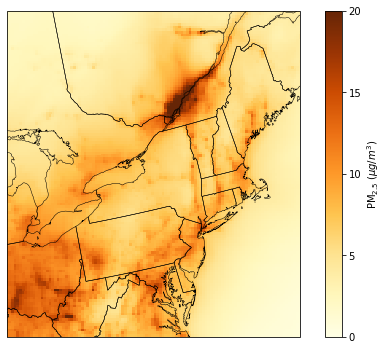

In [95]:
# NYGrid 2018 winter PM2.5 mean
plots.conc_map(pm25_winter_mean_nygrid, cmap=cm.get_cmap('YlOrBr'),
               figsize=(9, 6), ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
                proj_bounds=closer_bounds,
               vmin=0, vmax=20,
               cbar_args={
                   "cbar_ticks": [0, 5, 10, 15, 20],
                    "cbar_label": 'PM$_{2.5}$ ($\mu g/m^{3}$)'
                    },
               savefig=False,
               figpath='../cmaqpy/data/plots/winter_pm25_mean_nygrid.png')

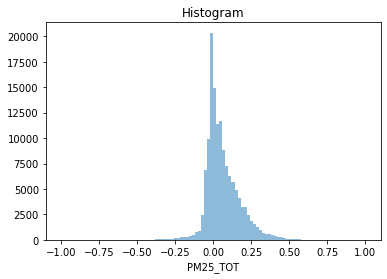

In [96]:
pm25_winter_mean_diff.plot.hist(bins=100, range=(-1, 1), label='Diff', alpha=0.5)
plt.show()

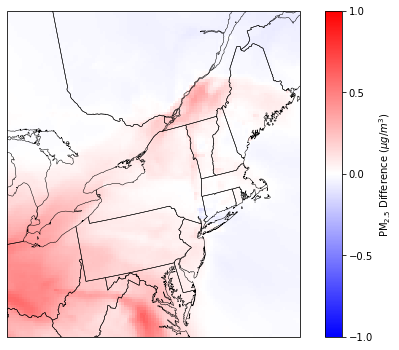

In [97]:
# NYGrid - EPA 2018 winter PM2.5 difference mean
plots.conc_map(pm25_winter_mean_diff,
               cmap=cm.get_cmap('bwr'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
                proj_bounds=closer_bounds,
               vmin=-1, vmax=1,
               cbar_args={
                   "cbar_ticks": [-1, -0.5, 0, 0.5, 1],
                   "cbar_label": 'PM$_{2.5}$ Difference ($\mu g/m^{3}$)',
               },
               savefig=False, 
               figpath='../cmaqpy/data/plots/winter_pm25_diff_mean.png')

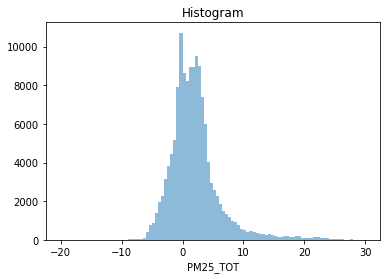

In [98]:
pm25_winter_mean_pct_diff.plot.hist(bins=100, 
                                    range=(-20, 30), 
                                    label='Pct Diff',
                                    alpha=0.5)
plt.show()

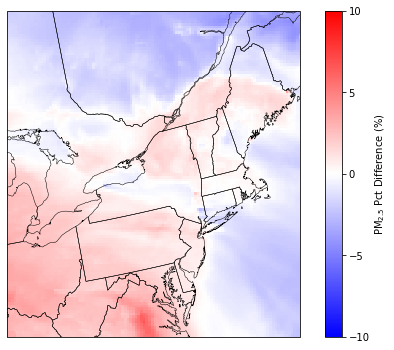

In [100]:
# NYGrid - EPA 2018 winter PM2.5 percent difference mean
plots.conc_map(pm25_winter_mean_pct_diff,
               cmap=cm.get_cmap('bwr'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
                proj_bounds=closer_bounds,
               vmin=-10, vmax=10,
               cbar_args={
                   "cbar_ticks": [-25, -20, -15, -10, -5, 0, 5, 10, 15, 20, 25],
                   "cbar_label": 'PM$_{2.5}$ Pct Difference (%)',
               },
               savefig=False, 
               figpath='../cmaqpy/data/plots/winter_pm25_pct_diff_mean.png')

### 1.2. Summer PM2.5

In [35]:
# Get the plot variables
pm25_summer_mean_base = conc_summer_base['PM25_TOT'].mean(dim='time').squeeze()
pm25_summer_mean_nygrid = conc_summer_nygrid['PM25_TOT'].mean(dim='time').squeeze()
pm25_summer_mean_diff = (conc_summer_nygrid['PM25_TOT'] - conc_summer_base['PM25_TOT']).mean(dim='time').squeeze()
pm25_summer_mean_pct_diff = ((conc_summer_nygrid['PM25_TOT'] - conc_summer_base['PM25_TOT']) 
                      / conc_summer_base['PM25_TOT'] * 100).mean(dim='time').squeeze()

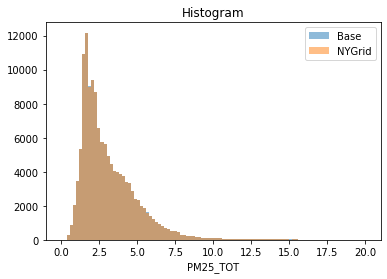

In [36]:
pm25_summer_mean_base.plot.hist(bins=100, range=(0, 20), label='Base', alpha=0.5)
pm25_summer_mean_nygrid.plot.hist(bins=100, range=(0, 20), label='NYGrid', alpha=0.5)
plt.legend()
plt.show()

/home/by276/anaconda3/envs/optwrf_new/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1598: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  shading=shading)


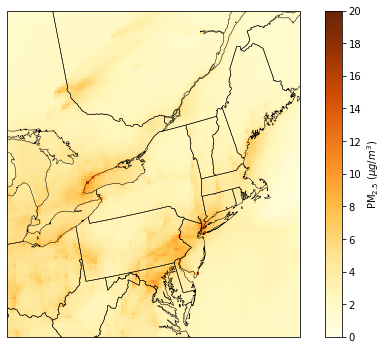

In [37]:
# EPA 2018 summer PM2.5 mean
plots.conc_map(pm25_summer_mean_base, cmap=cm.get_cmap('YlOrBr'),
               figsize=(9, 6), ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
                proj_bounds=closer_bounds,
               vmin=0, vmax=20,
               cbar_args={
                   "cbar_ticks": [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20],
                    "cbar_label": 'PM$_{2.5}$ ($\mu g/m^{3}$)'
                    },
               savefig=False,
               figpath='../cmaqpy/data/plots/summer_pm25_mean_base.png')

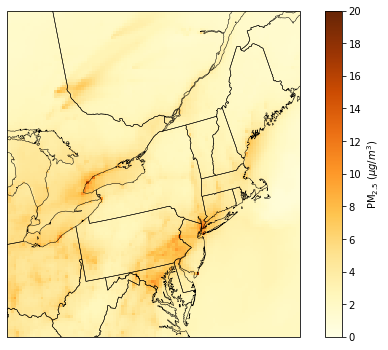

In [38]:
# NYGrid 2018 summer PM2.5 mean
plots.conc_map(pm25_summer_mean_nygrid, cmap=cm.get_cmap('YlOrBr'),
               figsize=(9, 6), ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=0, vmax=20,
               cbar_args={
                   "cbar_ticks": [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20],
                    "cbar_label": 'PM$_{2.5}$ ($\mu g/m^{3}$)'
                    },
               savefig=False,
               figpath='../cmaqpy/data/plots/summer_pm25_mean_nygrid.png')

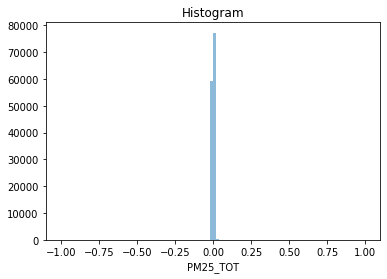

In [39]:
pm25_summer_mean_diff.plot.hist(bins=100, range=(-1, 1), label='Diff', alpha=0.5)
plt.show()

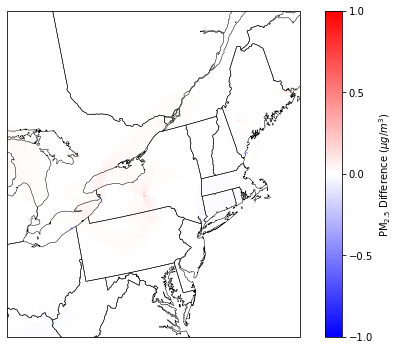

In [40]:
# NYGrid - EPA 2018 summer PM2.5 difference mean
plots.conc_map(pm25_summer_mean_diff,
               cmap=cm.get_cmap('bwr'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=-1,
               vmax=1,
               cbar_args={
                   "cbar_ticks": [-1, -0.5, 0, 0.5, 1],
                   "cbar_label": 'PM$_{2.5}$ Difference ($\mu g/m^{3}$)',
               },
               savefig=False, 
               figpath='../cmaqpy/data/plots/summer_pm25_diff_mean.png')

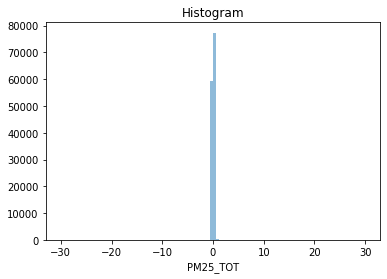

In [41]:
pm25_summer_mean_pct_diff.plot.hist(bins=100, 
                                    range=(-30, 30), 
                                    label='Pct Diff',
                                    alpha=0.5)
plt.show()

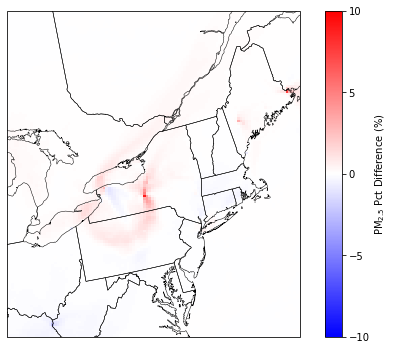

In [42]:
# NYGrid - EPA 2018 summer PM2.5 percent difference mean
plots.conc_map(pm25_summer_mean_pct_diff,
               cmap=cm.get_cmap('bwr'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=-10,
               vmax=10,
               cbar_args={
                   "cbar_ticks": [-10, -5, 0, 5, 10],
                   "cbar_label": 'PM$_{2.5}$ Pct Difference (%)',
               },
               savefig=False, 
               figpath='../cmaqpy/data/plots/summer_pm25_pct_diff_mean.png')

### 2.1. Winter Ozone

In [43]:
# O3
o3_winter_mean_base = conc_winter_base['O3'].mean(dim='time').squeeze()
o3_winter_mean_nygrid = conc_winter_nygrid['O3'].mean(dim='time').squeeze()
o3_winter_mean_diff = (conc_winter_nygrid['O3'] - conc_winter_base['O3']).mean(dim='time').squeeze()
o3_winter_mean_pct_diff = ((conc_winter_nygrid['O3'] - conc_winter_base['O3']) 
                    / conc_winter_base['O3'] * 100).mean(dim='time').squeeze()


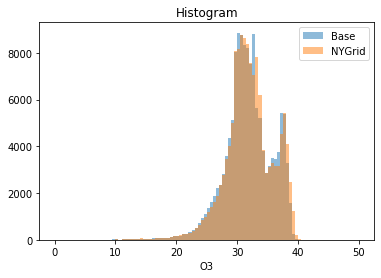

In [44]:
o3_winter_mean_base.plot.hist(bins=100, range=(0, 50), label='Base', alpha=0.5)
o3_winter_mean_nygrid.plot.hist(bins=100, range=(0, 50), label='NYGrid', alpha=0.5)
plt.legend()
plt.show()

/home/by276/anaconda3/envs/optwrf_new/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1598: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  shading=shading)


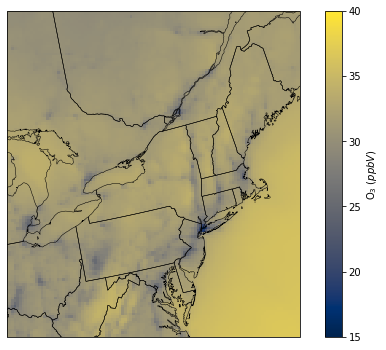

In [45]:
# EPA 2018 winter O3 mean
plots.conc_map(o3_winter_mean_base,
               cmap=cm.get_cmap('cividis'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=15,
               vmax=40,
               cbar_args={"cbar_ticks": [15, 20, 25, 30, 35, 40],
                          "cbar_label": 'O$_{3}$ ($ppbV$)'},
               savefig=False,
               figpath='../cmaqpy/data/plots/winter_o3_mean_base.png')

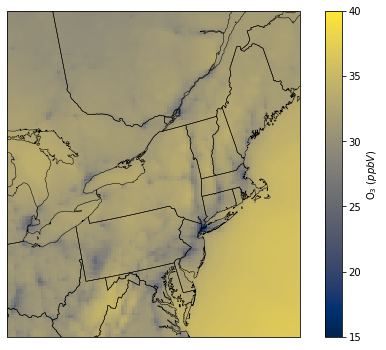

In [46]:
# NYGrid 2018 winter O3 mean
plots.conc_map(o3_winter_mean_nygrid,
               cmap=cm.get_cmap('cividis'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=15,
               vmax=40,
               cbar_args={"cbar_ticks": [15, 20, 25, 30, 35, 40],
                          "cbar_label": 'O$_{3}$ ($ppbV$)'},
               savefig=False,
               figpath='../cmaqpy/data/plots/winter_o3_mean_nygrid.png')

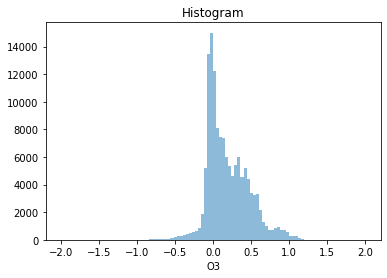

In [47]:
o3_winter_mean_diff.plot.hist(bins=100, range=(-2, 2), label='Diff', alpha=0.5)
plt.show()

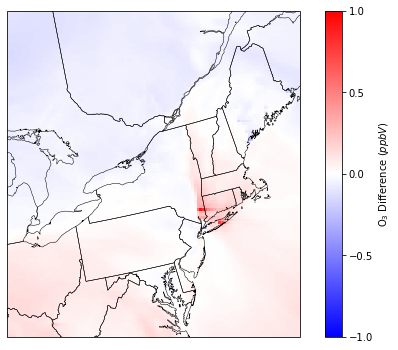

In [48]:
# NYGrid - EPA 2018 winter O3 difference mean
plots.conc_map(o3_winter_mean_diff,
               cmap=cm.get_cmap('bwr'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=-1,
               vmax=1,
               cbar_args={
                   "cbar_ticks": [-1, -0.5, 0, 0.5, 1],
                   "cbar_label": 'O$_{3}$ Difference ($ppbV$)'
               },
               savefig=False, 
               figpath='../cmaqpy/data/plots/winter_o3_diff_mean.png')

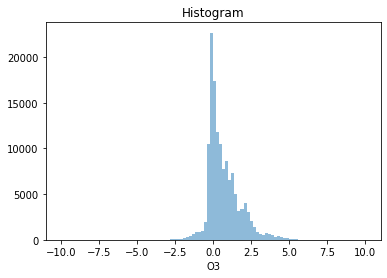

In [49]:
o3_winter_mean_pct_diff.plot.hist(bins=100, 
                                  range=(-10, 10), 
                                  label='Pct Diff',
                                  alpha=0.5)
plt.show()

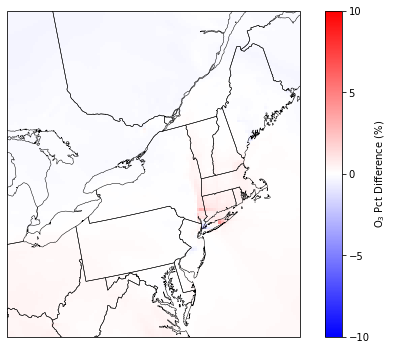

In [50]:
# NYGrid - EPA 2018 winter O3 percent difference mean
plots.conc_map(o3_winter_mean_pct_diff,
               cmap=cm.get_cmap('bwr'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=-10,
               vmax=10,
               cbar_args={
                   "cbar_ticks": [-10, -5, 0, 5, 10],
                    "cbar_label": 'O$_{3}$ Pct Difference (%)'
                },
               savefig=False,
               figpath='../cmaqpy/data/plots/winter_o3_pct_diff_mean.png')

### 2.2. Summer Ozone

In [51]:
# O3
o3_summer_mean_base = conc_summer_base['O3'].mean(dim='time').squeeze()
o3_summer_mean_nygrid = conc_summer_nygrid['O3'].mean(dim='time').squeeze()
o3_summer_mean_diff = (conc_summer_nygrid['O3'] - conc_summer_base['O3']).mean(dim='time').squeeze()
o3_summer_mean_pct_diff = ((conc_summer_nygrid['O3'] - conc_summer_base['O3']) 
                    / conc_summer_base['O3'] * 100).mean(dim='time').squeeze()

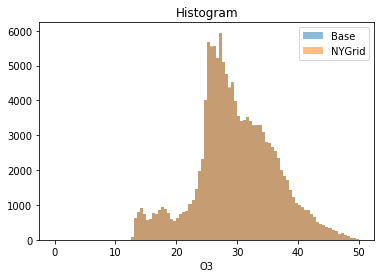

In [52]:
o3_summer_mean_base.plot.hist(bins=100, range=(0, 50), label='Base', alpha=0.5)
o3_summer_mean_nygrid.plot.hist(bins=100, range=(0, 50), label='NYGrid', alpha=0.5)
plt.legend()
plt.show()

/home/by276/anaconda3/envs/optwrf_new/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1598: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  shading=shading)


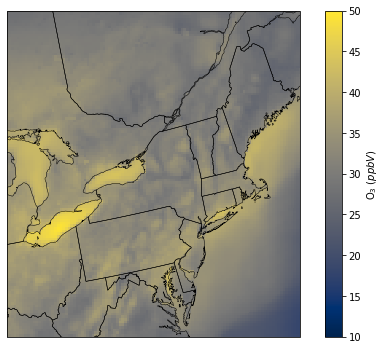

In [53]:
# EPA 2018 summer O3 mean
plots.conc_map(o3_summer_mean_base,
               cmap=cm.get_cmap('cividis'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=10,
               vmax=50,
               cbar_args={"cbar_ticks": [10, 15, 20, 25, 30, 35, 40, 45, 50],
                          "cbar_label": 'O$_{3}$ ($ppbV$)'},
               savefig=False,
               figpath='../cmaqpy/data/plots/summer_o3_mean_base.png')

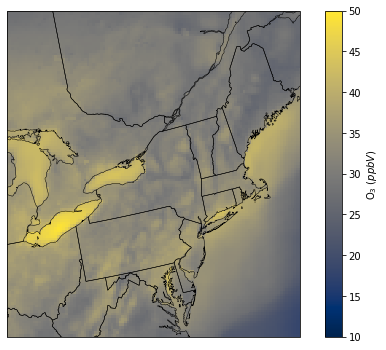

In [54]:
# NYGrid 2018 summer O3 mean
plots.conc_map(o3_summer_mean_nygrid,
               cmap=cm.get_cmap('cividis'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=10,
               vmax=50,
               cbar_args={"cbar_ticks": [10, 15, 20, 25, 30, 35, 40, 45, 50],
                          "cbar_label": 'O$_{3}$ ($ppbV$)'},
               savefig=False,
               figpath='../cmaqpy/data/plots/summer_o3_mean_nygrid.png')

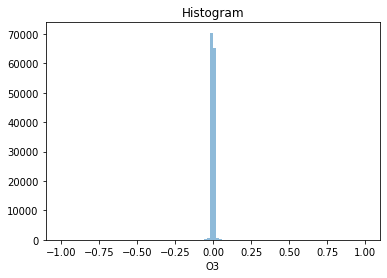

In [55]:
o3_summer_mean_diff.plot.hist(bins=100, range=(-1, 1), label='Diff', alpha=0.5)
plt.show()

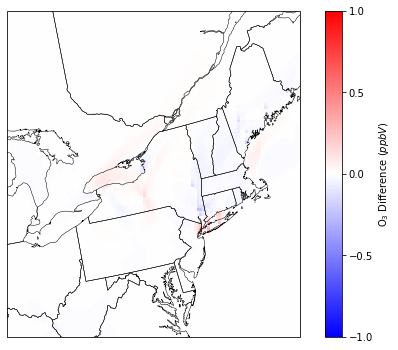

In [56]:
# EPA - NYGrid 2018 summer O3 difference mean
plots.conc_map(o3_summer_mean_diff,
               cmap=cm.get_cmap('bwr'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=-1,
               vmax=1,
               cbar_args={
                   "cbar_ticks": [-1, -0.5, 0, 0.5, 1],
                   "cbar_label": 'O$_{3}$ Difference ($ppbV$)'
               },
               savefig=False, 
               figpath='../cmaqpy/data/plots/o3_diff_12km.png')

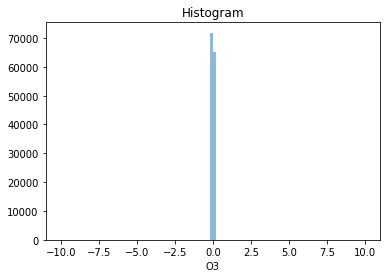

In [57]:
o3_summer_mean_pct_diff.plot.hist(bins=100, 
                                  range=(-10, 10), 
                                  label='Pct Diff',
                                  alpha=0.5)
plt.show()

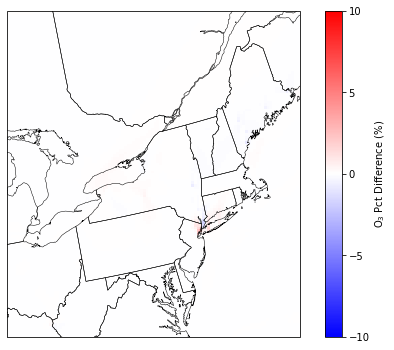

In [58]:
# EPA - NYGrid 2018 summer O3 percent difference mean
plots.conc_map(o3_summer_mean_pct_diff,
               cmap=cm.get_cmap('bwr'),
               figsize=(9, 6),
               ax=None,
               cartopy_crs=ccrs,
            #    proj_bounds=proj_bounds,
               proj_bounds=closer_bounds,
               vmin=-10,
               vmax=10,
               cbar_args={
                   "cbar_ticks": [-10, -5, 0, 5, 10],
                    "cbar_label": 'O$_{3}$ Pct Difference (%)'
                },
               savefig=False,
               figpath='../cmaqpy/data/plots/summer_o3_pct_diff_mean.png')